# **Intro M1**
In this notebook I set up semi-supervised VAE to predict cell type proportions from bulk data.
This is the original model structure (M1)
This is almost identical to "[DIVA: DOMAIN INVARIANT VARIATIONAL AUTOENCODERS](https://arxiv.org/pdf/1905.10427.pdf)".
To breifly describe the model, we have 3 independent encoders that encode for different sources of variation: cell-type proportion, sample-id, and everything else (slack).
To enforce this disentanglement, there are classification losses on the cell-type and smaple_id embeddings.
The embeddings are then concatenated together and used as input to a joint decoder.
When used in the semi-supervised mode, the classification loss is calculated by comparing the classifier output to the latent digit representation.
The model is depicted below.



The experimental set-up is as follows:
All data is from pbmc6k dataset.
Cells are sampled to generate 10 pesudobulks.
There are perturbed samples --> this means that for some samples we have mono14 cells instead of mono16 cells. 
This is like a perturbation that would cause one cell type to change.
We use 2 samples as the labeled data (meaning each sample has a ground truth) and 8 samples with unlabeled data (ground truth proportions are not used in training.)




This code was based off of DIVA's codebase: https://github.com/AMLab-Amsterdam/DIVA

Semi-supervised training method was take from here:
And this tutorial: https://github.com/bjlkeng/sandbox/tree/master/notebooks/vae-semi_supervised_learning with an awesome accomanying blogpost: https://bjlkeng.github.io/posts/semi-supervised-learning-with-variational-autoencoders/

Another codebase referenced: https://github.com/saemundsson/semisupervised_vae



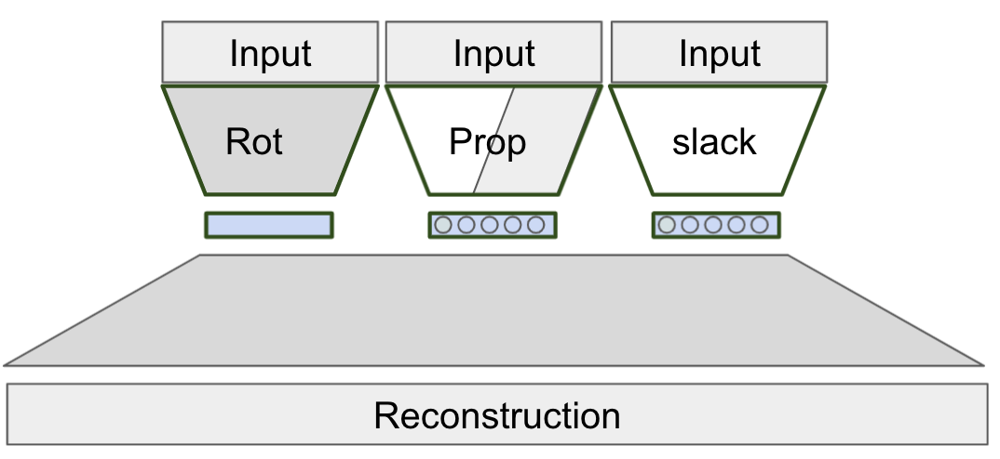

# **Imports**

In [2]:
# general imports
import warnings
import numpy as np
import tensorflow as tf
from tensorflow.keras.layers import Input, Dense, Lambda, Flatten, Softmax, ReLU, ELU, LeakyReLU
from keras.layers.merge import concatenate as concat
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras import backend as K
from tensorflow.keras.losses import mean_absolute_error, mean_squared_error, KLDivergence
from tensorflow.keras.datasets import mnist
from tensorflow.keras.activations import relu, linear
from tensorflow.keras.utils import to_categorical, normalize, plot_model
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam, SGD
import matplotlib.pyplot as plt
from scipy.spatial import distance_matrix
from scipy.stats import spearmanr, pearsonr
from scipy.spatial.distance import euclidean
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.metrics import accuracy_score
from PIL import Image

from tqdm import tnrange, tqdm_notebook
import ipywidgets

# Images, plots, display, and visualization
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from sklearn.manifold import TSNE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import scale, MinMaxScaler
from matplotlib_venn import venn2

# programming stuff
import time
import os
import pickle
from pathlib import Path

# import the SC_preprocessing code
import sys
sys.path.insert(1, '../../')
sys.path.insert(1, '../')
from sc_preprocessing import sc_preprocess


# disable eager execution
# https://github.com/tensorflow/tensorflow/issues/47311#issuecomment-786116401
from tensorflow.python.framework.ops import disable_eager_execution
disable_eager_execution()


In [3]:
## parameters
aug_data_path = f"{os.getcwd()}/../data/single_cell_data/augmented_kang_data/"
res_data_path = f"{os.getcwd()}/../results/single_cell_data/buddiM2_kang/"
cibersort_genes_path = f"{os.getcwd()}/../results/single_cell_data/cibersort_kang/CIBERSORTx_Job17_kang_1_cybersort_sig_inferred_phenoclasses.CIBERSORTx_Job17_kang_1_cybersort_sig_inferred_refsample.bm.K999.txt"

# cibersort results
cibersort_file_path = f"{os.getcwd()}/../results/single_cell_data/cibersort_kang/CIBERSORTx_Job18_Results.csv"

# bp results
bp_res_path = f"{os.getcwd()}/../results/single_cell_data/bp_kang/"

num_genes = 7000

exp_id = "kang"

# Set-up experimental variables

In [4]:

##################################################
#####. set up experiment specific variables
##################################################

# number expected cell types
n_cell_types = 10

# number of patients/domains/samples expected
idx_range = range(0, 16)
n_tot_samples = 8 # 8 patients, 2 samples each

# number of drugs (one-hot encoded)
n_drugs = 2

# experiment id
lab_file_name = exp_id

# number of pseudobulks PER patient
n_train = 1000



### create the domains label 
Label_full = np.concatenate([np.full(n_train, 0), np.full(n_train, 0),
                            np.full(n_train, 1), np.full(n_train, 1),
                            np.full(n_train, 2), np.full(n_train, 2),
                            np.full(n_train, 3), np.full(n_train, 3),
                            np.full(n_train, 4), np.full(n_train, 4),
                            np.full(n_train, 5), np.full(n_train, 5),
                            np.full(n_train, 6), np.full(n_train, 6),
                            np.full(n_train, 7), np.full(n_train, 7)], axis=0)
label_full = to_categorical(Label_full)

### create the drugs label 
Drug_full = np.concatenate([np.full(n_train, 1), np.full(n_train, 0),
                            np.full(n_train, 1), np.full(n_train, 0),
                            np.full(n_train, 1), np.full(n_train, 0),
                            np.full(n_train, 1), np.full(n_train, 0),
                            np.full(n_train, 1), np.full(n_train, 0),
                            np.full(n_train, 1), np.full(n_train, 0),
                            np.full(n_train, 1), np.full(n_train, 0),
                            np.full(n_train, 1), np.full(n_train, 0)], axis=0)
drug_full = to_categorical(Drug_full)


# indexes for the training
# 0, 1 no drug is labeled 
# 0,3-9 is unlabeled

idx_train = np.where(np.logical_and(Label_full < 2, Drug_full == 0))[0] 
idx_unlab = np.where(np.logical_or(Label_full >= 2, Drug_full != 0))[0]
idx_drug = np.where(Drug_full > 0)[0]


# **Load / Pre-process data**
Import pre-processed pseudobulks

In [5]:

##################################################
#####. Design the experiment
##################################################

# read in the labeled data
X_train, Y_train, gene_df = sc_preprocess.read_all_diva_files(aug_data_path, idx_range, lab_file_name)
X_train.columns = gene_df

# only get genes that are available in both testing and training
common_genes_file = os.path.join(aug_data_path, "kang_genes.pkl")
gene_out_path = Path(common_genes_file)
common_genes = pickle.load(open( gene_out_path, "rb" ))

# try using the cibersort genes
cibersort_df = pd.read_csv(cibersort_genes_path, sep="\t" )
cibersort_genes = cibersort_df["NAME"].values.tolist()

# only keep cibersort genes that are in common genes
cibersort_genes = np.intersect1d(common_genes, cibersort_genes)

X_train = X_train[common_genes]

gene_df = gene_df.loc[gene_df.isin(common_genes)]


# convert to data matrices
X_full = X_train.to_numpy()
Y_full = Y_train.to_numpy()

## get the top variable genes
X_colmean = X_full.mean(axis=0)
X_colvar = X_full.var(axis=0)
X_CoV = np.array(np.divide(X_colvar, X_colmean+0.001))
idx_top = np.argpartition(X_CoV, -num_genes)[-num_genes:]
gene_df = gene_df.iloc[idx_top]


In [6]:
np.sort(X_colmean)

array([0.1964375, 0.1983125, 0.218, ..., 736813.628875, 843846.08825,
       1012879.5255], dtype=object)

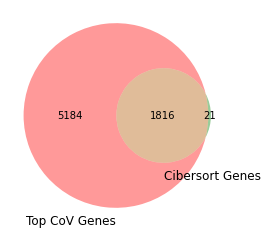

In [7]:

venn2([set(gene_df), set(cibersort_genes)], set_labels = ('Top CoV Genes', 'Cibersort Genes'))
plt.show()

In [8]:
union_genes = np.union1d(gene_df, cibersort_genes)


In [9]:
X_full = X_train.loc[:,union_genes]

## normalize within sample
clip_upper = np.quantile(X_full, 0.9)
X_full = np.clip(X_full, 0, clip_upper)
scaler = MinMaxScaler()
scaler.fit(X_full)
X_full = scaler.transform(X_full)



# for unknown proportions; i.e. 3 
X_unkp = X_full[idx_unlab,]
label_unkp = label_full[idx_unlab,]
drug_unkp = drug_full[idx_unlab,]
y_unkp = Y_full[idx_unlab,]

# for known proportions
X_kp = X_full[idx_train,]
label_kp = label_full[idx_train,]
drug_kp = drug_full[idx_train,]
y_kp = Y_full[idx_train,]



In [10]:
X_train

gene_ids,LINC00115,NOC2L,KLHL17,PLEKHN1,HES4,ISG15,AGRN,C1orf159,TNFRSF18,TNFRSF4,...,CPT1B,AF127936.5,AJ006998.2,CHODL,AP000476.1,LINC00158,AF131217.1,AP001437.1,TMPRSS3,LRRC3DN
0,0,446,97,163,66,6985,3,9,999,830,...,11,0,0,21,0,0,0,0,0,0
0,53,219,0,4,225,18203,4,3,833,181,...,24,0,5,0,3,83,41,0,0,1
0,10,334,0,14,280,20711,5,1,561,220,...,7,1,5,0,0,70,9,0,1,1
0,98,239,17,8,49,6571,0,19,3347,519,...,1,0,0,0,10,10,126,0,0,0
0,35,374,52,97,354,34742,6,9,478,90,...,7,3,0,1,0,133,12,3,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,0,683,0,0,101,434,9,0,933,924,...,0,0,0,0,0,0,0,0,0,0
0,0,340,0,0,71,801,0,0,2092,794,...,0,0,0,0,0,0,0,0,0,0
0,1,721,0,0,104,296,1,0,1107,406,...,0,0,0,0,0,0,0,0,0,0
0,0,633,0,0,19,527,19,5,528,1528,...,0,0,0,0,0,0,0,0,0,0


In [100]:
X_ids_temp = X_train.loc[:,union_genes]
X_ids_temp

gene_ids,A1BG,A2M,A2M-AS1,A4GALT,AAED1,AAGAB,AAK1,AAMP,AARSD1,AASDH,...,ZRSR2,ZSCAN16,ZSCAN21,ZSWIM4,ZUFSP,ZWILCH,ZYX,ZZEF1,ZZZ3,hsa-mir-1199
0,51,0,0,0,86,70,131,269,51,32,...,110,83,3,31,75,7,107,6,190,38
0,69,38,0,0,220,42,109,184,31,17,...,113,151,1,62,109,8,295,2,54,35
0,19,29,0,0,184,35,496,432,52,61,...,133,125,5,10,96,4,343,0,13,187
0,48,6,0,0,65,57,77,155,154,169,...,155,144,11,2,100,8,161,0,168,1
0,29,0,0,0,273,23,246,277,44,12,...,82,118,3,75,99,5,338,6,26,77
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
0,249,190,0,0,592,32,102,1658,21,125,...,149,31,197,67,187,30,745,192,377,32
0,88,37,0,1,370,67,101,1815,17,77,...,235,48,173,108,114,8,227,157,246,173
0,34,14,0,0,327,15,8,1864,4,13,...,323,14,35,122,263,3,117,119,41,102
0,186,585,0,0,818,9,27,2345,2,110,...,289,40,25,426,208,24,1183,221,74,26


In [101]:
union_genes

array(['A1BG', 'A2M', 'A2M-AS1', ..., 'ZZEF1', 'ZZZ3', 'hsa-mir-1199'],
      dtype=object)

In [11]:
Y_train

,B,CD4_Mem_T,CD4_Naive_T,CD8_T,CD14_Mono,CD16_Mono,DC,Mk,NK,T_Act
0,0.3536,0.5928,0.034,0.0004,0.002,0.0012,0.0002,0.0124,0.002,0.0014
0,0.0074,0.0004,0.0058,0.5038,0.0314,0.1418,0.1556,0.0016,0.0888,0.0634
0,0.0144,0.0144,0.2996,0.04,0.022,0.1748,0.0832,0.2066,0.026,0.119
0,0.0178,0.0078,0.002,0.0006,0.0002,0.0006,0.0228,0.004,0.9434,0.0008
0,0.2266,0.012,0.0022,0.11,0.3442,0.1452,0.0204,0.098,0.0154,0.026
...,...,...,...,...,...,...,...,...,...,...
0,0.0012,0.4106,0.0234,0.0346,0.0,0.3552,0.1376,0.005,0.0108,0.0216
0,0.0138,0.549,0.0368,0.1524,0.0066,0.0042,0.0322,0.037,0.0704,0.0976
0,0.0264,0.0606,0.496,0.0576,0.018,0.0408,0.0068,0.0486,0.0474,0.1978
0,0.2666,0.0828,0.1268,0.0234,0.017,0.052,0.29,0.106,0.0234,0.012


/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:780: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/sklearn/manifold/_t_sne.py:790: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


[t-SNE] Computing 121 nearest neighbors...
[t-SNE] Indexed 16000 samples in 0.150s...
[t-SNE] Computed neighbors for 16000 samples in 12.771s...
[t-SNE] Computed conditional probabilities for sample 1000 / 16000
[t-SNE] Computed conditional probabilities for sample 2000 / 16000
[t-SNE] Computed conditional probabilities for sample 3000 / 16000
[t-SNE] Computed conditional probabilities for sample 4000 / 16000
[t-SNE] Computed conditional probabilities for sample 5000 / 16000
[t-SNE] Computed conditional probabilities for sample 6000 / 16000
[t-SNE] Computed conditional probabilities for sample 7000 / 16000
[t-SNE] Computed conditional probabilities for sample 8000 / 16000
[t-SNE] Computed conditional probabilities for sample 9000 / 16000
[t-SNE] Computed conditional probabilities for sample 10000 / 16000
[t-SNE] Computed conditional probabilities for sample 11000 / 16000
[t-SNE] Computed conditional probabilities for sample 12000 / 16000
[t-SNE] Computed conditional probabilities for s

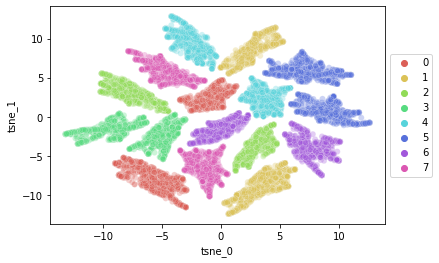

In [12]:
## plot samples
tsne = TSNE(n_components=2, verbose=1, perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(X_full)

plot_df = pd.DataFrame(tsne_results[:,0:2])
print(tsne_results.shape)
print(plot_df.shape)
plot_df.columns = ['tsne_0', 'tsne_1']
plot_df['augmentation'] = Label_full

g = sns.scatterplot(
    x="tsne_0", y="tsne_1",
    data=plot_df,
    hue="augmentation",
    palette=sns.color_palette("hls", n_tot_samples),
    legend="full",
    alpha=0.3
)
g.legend(loc='center left', bbox_to_anchor=(1, 0.5))


In [13]:
idx_9 = np.where(Label_full == 9)[0]
true_9_prop_df = Y_train.iloc[idx_9]
X_unkp_9 = X_full[idx_9,]


# **M2 Model Definition**

## Hyperparameters

In [14]:

##################################################
#####. Hyperparameters
##################################################

batch_size = 500
n_epoch = 100 # 500 

alpha_rot = 1000000 #1000000
alpha_drug = 10000 #1000000
alpha_prop = 100 #100

beta_kl_slack = 0.1 # 10 ###
beta_kl_rot = 100 # 100 ###
beta_kl_drug = 100 # 100 ###


n_x = X_full.shape[1]
n_y = Y_full.shape[1]
n_label = n_tot_samples  # 8 donors 
n_drugs = n_drugs  # number of drugs one-hot encoded
n_label_z = 64  # 64 dimensional representation of rotation


# the network dimensions are 784 > 512 > proportion_dim < 512 < 784
n_z = Y_full.shape[1] # latent space size, one latent dimension PER cell type
encoder_dim = 512 # dim of encoder hidden layer 512 
decoder_dim = 512 # dim of encoder hidden layer 512 
decoder_out_dim = n_x # dim of decoder output layer

# labeled classifier
class_dim1 = 512 # 512 
class_dim2 = 256 # 256 


activ = 'relu'
optim = Adam(learning_rate=0.0005) #0.001
print(f"length of X {n_x} and length of y {n_y} n_label {n_label} and n_drugs {n_drugs}")



length of X 7021 and length of y 10 n_label 8 and n_drugs 2


## Encoder + Y classifier

In [15]:
# declare the Keras tensor we will use as input to the encoder
X = Input(shape=(n_x,))
Y = Input(shape=(n_y,))
label = Input(shape=(n_label,))
props = Input(shape=(n_y,))
z_in = Input(shape=(n_y+n_label_z+n_label_z+n_label_z,))
cls_in = Input(shape=(n_label_z,))

inputs = X

# set up encoder network
# this is an encoder with 512 hidden layer
# Dense is a functor, with given initializations (activation and hidden layer dimension)
# After initialization, the functor is returned and inputs is used as an arguement
encoder_s = Dense(encoder_dim, activation=activ, name="encoder_slack")(inputs)
encoder_r = Dense(encoder_dim, activation=activ, name="encoder_rot")(inputs)
encoder_d = Dense(encoder_dim, activation=activ, name="encoder_drug")(inputs)

# now from the hidden layer, you get the mu and sigma for 
# the latent space

mu_slack = Dense(n_label_z, activation='linear', name = "mu_slack")(encoder_s)
l_sigma_slack = Dense(n_label_z, activation='linear', name = "sigma_slack")(encoder_s)

mu_rot = Dense(n_label_z, activation='linear', name = "mu_rot")(encoder_r)
l_sigma_rot = Dense(n_label_z, activation='linear', name = "sigma_rot")(encoder_r)


mu_drug = Dense(n_label_z, activation='linear', name = "mu_drug")(encoder_d)
l_sigma_drug = Dense(n_label_z, activation='linear', name = "sigma_drug")(encoder_d)



# set up labeled classifier
#defining the architecture of the classifier

class_hidden1 = Dense(class_dim1, activation=activ, name = "cls_h1")
class_hidden2 = Dense(class_dim2, activation=activ, name="cls_h2")
class_out = Dense(n_y, activation='softmax', name="cls_out")

#x_concat_lab = tf.keras.layers.concatenate([inputs, label])
#classifier_h1 = class_hidden1(tf.keras.layers.Concatenate()([inputs, label]))
classifier_h1 = class_hidden1(inputs)
classifier_h2 = class_hidden2(classifier_h1)
Y_cls = class_out(classifier_h2)



## Latent Space

In [16]:
# now we need the sampler from mu and sigma
def sample_z(args):
    mu, l_sigma, n_z = args
    eps = K.random_normal(shape=(batch_size, n_z), mean=0., stddev=1.)
    return mu + K.exp(l_sigma / 2) * eps


# Sampling latent space
z_slack = Lambda(sample_z, output_shape = (n_label_z, ), name="z_samp_slack")([mu_slack, l_sigma_slack, n_label_z])
z_rot = Lambda(sample_z, output_shape = (n_label_z, ), name="z_samp_rot")([mu_rot, l_sigma_rot, n_label_z])
z_drug = Lambda(sample_z, output_shape = (n_label_z, ), name="z_samp_drug")([mu_drug, l_sigma_drug, n_label_z])

z_concat_lab = concat([z_slack, Y, z_rot, z_drug])
z_concat_unlab = concat([z_slack, Y_cls, z_rot, z_drug])

2023-02-02 10:14:12.770254: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


## Decoder + Classifiers

In [17]:
def null_f(args):
    return args

###### DECODER
# set up decoder network
# this is a decoder with 512 hidden layer
decoder_hidden = Dense(decoder_dim, activation=activ, name = "decoder_h1")

# final reconstruction
decoder_out = Dense(decoder_out_dim, activation='sigmoid', name = "decoder_out")

d_in = Input(shape=(n_label_z+n_y+n_label_z+n_label_z,))
d_h1 = decoder_hidden(d_in)
d_out = decoder_out(d_h1)

# set up the decoder part that links to the encoder
# labeled decoder
h_lab = decoder_hidden(z_concat_lab)
outputs_lab = decoder_out(h_lab)

# unlabeled decoder
h_unlab = decoder_hidden(z_concat_unlab)
outputs_unlab = decoder_out(h_unlab)


###### Rotations classifier
# this is the rotation we try to estimate
rot_h1 = ReLU(name = "rot_h1")
rot_h2 = Dense(n_label, activation='linear', name = "rot_h2")
rot_softmax = Softmax(name = "mu_rot_pred")
decoder_sigma_r = Lambda(null_f, name = "l_sigma_rot_pred")


rot_1_out = rot_h1(z_rot)
rot_2_out = rot_h2(rot_1_out)
rotation_outputs = rot_softmax(rot_2_out)
sigma_outputs_r = decoder_sigma_r(l_sigma_rot)



###### Drug classifier
# this is the drug we try to estimate
drug_h1 = ReLU(name = "drug_h1")
drug_h2 = Dense(n_drugs, activation='linear', name = "drug_h2")
drug_softmax = Softmax(name = "mu_drug_pred")
decoder_sigma_d = Lambda(null_f, name = "l_sigma_drug_pred")


drug_1_out = drug_h1(z_drug)
drug_2_out = drug_h2(drug_1_out)
drug_outputs = drug_softmax(drug_2_out)
sigma_outputs_d = decoder_sigma_d(l_sigma_drug)








## Loss

In [18]:

def vae_loss(y_true, y_pred):
    recon = K.sum(mean_squared_error(y_true, y_pred), axis=-1)
    kl_rot = beta_kl_rot * K.sum(K.exp(l_sigma_rot) + K.square(mu_rot) - 1. - l_sigma_rot, axis=-1)
    kl_drug = beta_kl_drug * K.sum(K.exp(l_sigma_drug) + K.square(mu_drug) - 1. - l_sigma_drug, axis=-1)
    kl_slack = beta_kl_slack * K.sum(K.exp(l_sigma_slack) + K.square(mu_slack) - 1. - l_sigma_slack, axis=-1)
    return recon + kl_rot +kl_drug+ kl_slack


def recon_loss(y_true, y_pred):
	return K.sum(mean_squared_error(y_true, y_pred), axis=-1)


def prop_loss(y_true, y_pred):
  return K.sum(mean_absolute_error(y_true, y_pred), axis=-1) * alpha_prop

def drug_loss(y_true, y_pred):
  return K.sum(mean_absolute_error(y_true, y_pred), axis=-1) * alpha_drug


def class_loss(y_true, y_pred):
    recon = K.sum(K.binary_crossentropy(y_true, y_pred), axis=-1)*alpha_rot
    return recon



## Make the computational graph

In [19]:
classifier = Model(X, Y_cls)

known_prop_vae = Model([X, Y], [outputs_lab, Y_cls, rotation_outputs, drug_outputs])
unknown_prop_vae = Model(X, [outputs_unlab, rotation_outputs, drug_outputs])

known_prop_vae.compile(optimizer=optim, loss=[vae_loss, prop_loss, class_loss, drug_loss]) #, metrics = [KL_loss, recon_loss])
unknown_prop_vae.compile(optimizer=optim, loss=[vae_loss, class_loss, drug_loss]) #, metrics = [KL_loss, recon_loss])

encoder_unlab = Model(X, [z_slack, mu_slack, l_sigma_slack, z_rot, mu_rot, l_sigma_rot, z_drug, mu_drug, l_sigma_drug])

encoder_lab = Model([X, Y], [z_slack, mu_slack, l_sigma_slack, z_rot, mu_rot, l_sigma_rot, z_drug, mu_drug, l_sigma_drug])


decoder = Model(d_in, d_out)


print(known_prop_vae.summary())
print(unknown_prop_vae.summary())


Model: "model_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 7021)]       0                                            
__________________________________________________________________________________________________
encoder_slack (Dense)           (None, 512)          3595264     input_1[0][0]                    
__________________________________________________________________________________________________
encoder_rot (Dense)             (None, 512)          3595264     input_1[0][0]                    
__________________________________________________________________________________________________
encoder_drug (Dense)            (None, 512)          3595264     input_1[0][0]                    
____________________________________________________________________________________________

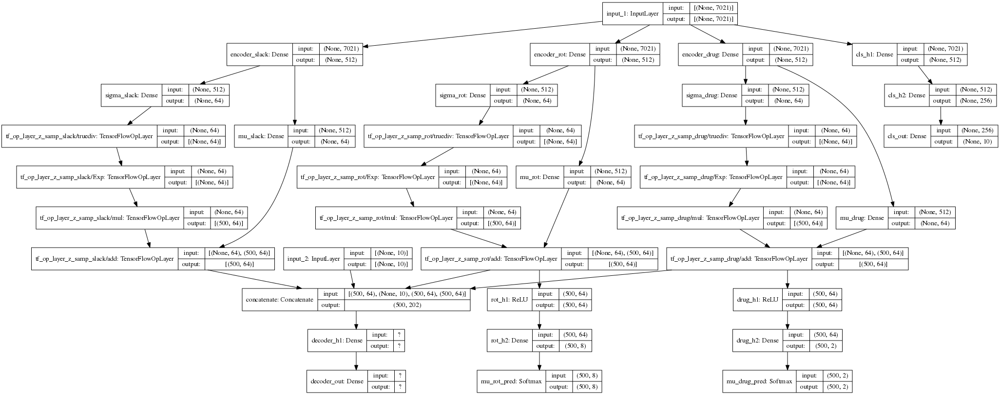

In [20]:
display(plot_model(known_prop_vae, show_layer_names=True, show_shapes=True, dpi=72))

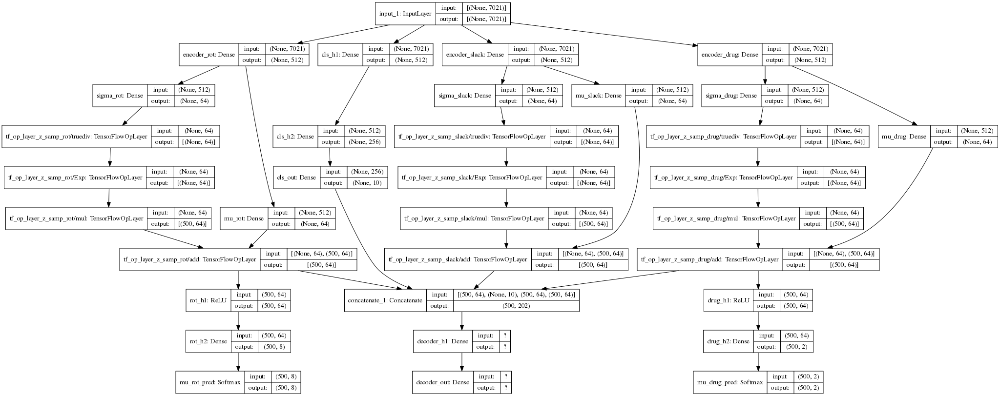

In [21]:
display(plot_model(unknown_prop_vae, show_layer_names=True, show_shapes=True, dpi=72))

# **Training**

Here we train using both the known and unknown cell-type proportions.
The labeled data is repeated in order to match the dimension of the unlabeled data so that they have the same batch size.
This code is taken from https://github.com/bjlkeng/sandbox/blob/master/notebooks/vae-semi_supervised_learning/vae-m2-fit-mnist.ipynb

In [22]:


def fit_model(X_unknown_prop, label_unknown_prop, drug_unknown_prop, X_known_prop, Y_known_prop, label_known_prop, drug_known_prop, epochs):
    assert len(X_unknown_prop) % len(X_known_prop) == 0, \
            (len(X_unknown_prop), batch_size, len(X_known_prop))
    start = time.time()
    history = []
    meta_hist = []
    
    for epoch in range(epochs):
        unlabeled_index = np.arange(len(X_unknown_prop))
        np.random.shuffle(unlabeled_index)

        # Repeat the unlabeled data to match length of labeled data
        labeled_index = []
        for i in range(len(X_unknown_prop) // len(X_known_prop)):
            l = np.arange(len(X_known_prop))
            np.random.shuffle(l)
            labeled_index.append(l)
        labeled_index = np.concatenate(labeled_index)
        
        batches = len(X_unknown_prop) // batch_size
        for i in range(batches):
            # Labeled
            index_range =  labeled_index[i * batch_size:(i+1) * batch_size]
            loss = known_prop_vae.train_on_batch([X_known_prop[index_range], Y_known_prop[index_range]],
                                                    [X_known_prop[index_range], Y_known_prop[index_range], label_known_prop[index_range], drug_known_prop[index_range]])
            meta_hist.append(i)

            # Unlabeled
            index_range =  unlabeled_index[i * batch_size:(i+1) * batch_size]
            loss += [unknown_prop_vae.train_on_batch(X_unknown_prop[index_range],
                                                        [X_unknown_prop[index_range], label_unknown_prop[index_range], drug_unknown_prop[index_range]])]

            meta_hist.append(i)

            history.append(loss)
            
    
   
    done = time.time()
    elapsed = done - start
    print("Elapsed: ", elapsed)
    
    return [history, meta_hist]

Now train

In [23]:
# helper methods for evaluation
def sum_abs_error(y_pred, y_true):
  return sum(abs(y_pred - y_true))

def mean_abs_error(y_pred, y_true):
  return np.mean(abs(y_pred - y_true))

def mean_sqr_error(y_pred, y_true):
  return np.mean((y_pred - y_true)**2)

def get_errors(y_true, y_est):
  mse_err = [mean_sqr_error(y_true[idx], y_est[idx]) 
                  for idx in range(0, y_est.shape[0])]

  print(f"MSqE mean: {np.mean(mse_err)}, median: {np.median(mse_err)}, max: {max(mse_err)}")

  spr_err = [spearmanr(y_true[idx].astype(float), y_est[idx].astype(float))[0]
                    for idx in range(0, y_est.shape[0])]
  print(f"Spearman mean: {np.mean(spr_err)}, median: {np.median(spr_err)}, max: {max(spr_err)}")

  pear_err = [pearsonr(y_true[idx].astype(float), y_est[idx].astype(float))[0]
                    for idx in range(0, y_est.shape[0])]
  print(f"Pearson mean: {np.mean(pear_err)}, median: {np.median(pear_err)}, max: {max(pear_err)}")

  error_list = [mse_err, spr_err, pear_err]
  plot_df = [item for sublist in error_list for item in sublist]
  plot_df = pd.DataFrame(plot_df)
  plot_df.columns = ["error"]
  plot_df["error_type"] = ["MSQ"]*y_est.shape[0] + ["SPR"]*y_est.shape[0] + ["PEAR"]*y_est.shape[0]

  return plot_df


In [24]:
# X_unknown_prop, label_unknown_prop, X_known_prop, Y_known_prop, label_known_prop
loss_history = fit_model(X_unkp,
                    label_unkp,
                    drug_unkp,
                    X_kp, 
                    y_kp,
                    label_kp, 
                    drug_kp, epochs=n_epoch)



Elapsed:  540.7625317573547


In [25]:
meta_history = loss_history[1]
loss_history = loss_history[0]

# Plot Loss Curves

In [26]:
# write out the loss for later plotting
# unpack the loss values
labeled_total_loss = [item[0] for item in loss_history]
unlabeled_total_loss = [item[5][0] for item in loss_history]

labeled_recon_loss = [item[1] for item in loss_history]
unlabeled_recon_loss = [item[5][1] for item in loss_history]

labeled_prop_loss = [item[2] for item in loss_history]

labeled_samp_loss = [item[3] for item in loss_history]
unlabeled_samp_loss = [item[5][2] for item in loss_history]

labeled_drug_loss = [item[4] for item in loss_history]
unlabeled_drug_loss = [item[5][2] for item in loss_history]


# make into a dataframe
total_loss = labeled_total_loss + unlabeled_total_loss + [a + b for a, b in zip(labeled_total_loss, unlabeled_total_loss)]
loss_df = pd.DataFrame(data=total_loss, columns=['total_loss'])
loss_df['type'] = ["labeled"]*len(loss_history) + ["unlabeled"]*len(loss_history) + ["sum"]*len(loss_history)
loss_df['batch'] = [*range(len(loss_history))] + [*range(len(loss_history))] + [*range(len(loss_history))]

recon_loss = labeled_recon_loss + unlabeled_recon_loss + [a + b for a, b in zip(labeled_recon_loss, unlabeled_recon_loss)]
loss_df['recon_loss'] = recon_loss

prop_loss = labeled_prop_loss + [0]*len(loss_history) + labeled_prop_loss
loss_df['prop_loss'] = prop_loss

samp_loss = labeled_samp_loss + unlabeled_samp_loss + [a + b for a, b in zip(labeled_samp_loss, unlabeled_samp_loss)]
loss_df['samp_loss'] = samp_loss


drug_loss = labeled_drug_loss + unlabeled_drug_loss + [a + b for a, b in zip(labeled_drug_loss, unlabeled_drug_loss)]
loss_df['drug_loss'] = drug_loss



In [27]:
loss_df

,total_loss,type,batch,recon_loss,prop_loss,samp_loss,drug_loss
0,7.814654e+06,labeled,0,5856.626465,5649.282715,3.780078e+06,4.023070e+06
1,1.870743e+06,labeled,1,63579.949219,7339.233398,1.797451e+06,2.372416e+03
2,1.686438e+06,labeled,2,105830.562500,8147.790527,1.572367e+06,9.256598e+01
3,1.423542e+06,labeled,3,128517.460938,7028.503418,1.287965e+06,3.127542e+01
4,8.752256e+05,labeled,4,139855.906250,7147.270020,7.282051e+05,1.732270e+01
...,...,...,...,...,...,...,...
8395,1.466935e+04,sum,2795,12702.936523,339.590027,8.115687e+02,5.798815e+02
8396,1.399740e+04,sum,2796,12538.112305,293.941162,3.930166e+02,5.146680e+02
8397,1.385730e+04,sum,2797,12235.279297,344.542633,5.069819e+02,7.612333e+02
8398,1.516695e+04,sum,2798,11822.445312,289.470184,2.199535e+03,2.379565e+03


In [28]:
def read_loss_file(res_path, exp_id, unlab_id):
    loss_file = os.path.join(res_path, f"train-{exp_id}-{unlab_id}-DIVA_loss.pkl")
    loss_path = Path(loss_file)
    loss_df = pickle.load( open( loss_path, "rb" ) )
    return loss_df

def make_loss_fig(loss_df, ax, title, loss_to_plot):
    ## plot loss
    g = sns.lineplot(
        x="batch", y=loss_to_plot,
        data=loss_df,
        hue="type",
        legend="full",
        alpha=0.3, ax= ax
    )
    ax.set_title(title)
    return g

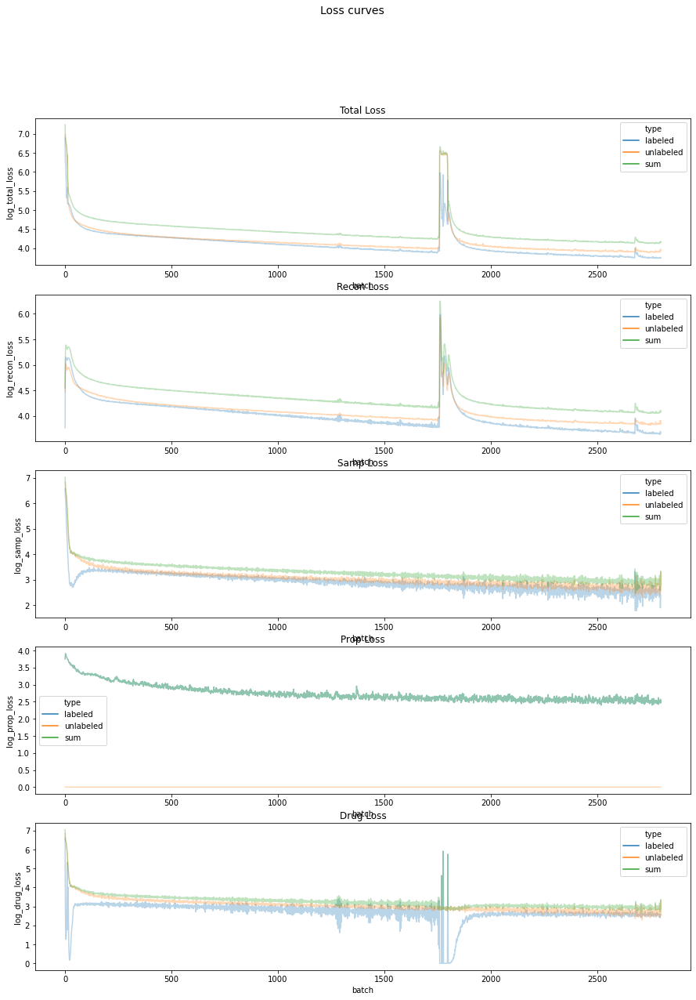

In [29]:

# add the log to make it easier to plot
loss_df["log_total_loss"] = np.log10(loss_df["total_loss"]+1)
loss_df["log_recon_loss"] = np.log10(loss_df["recon_loss"]+1)
loss_df["log_samp_loss"] = np.log10(loss_df["samp_loss"]+1)
loss_df["log_prop_loss"] = np.log10(loss_df["prop_loss"]+1)
loss_df["log_drug_loss"] = np.log10(loss_df["drug_loss"]+1)


fig, axs = plt.subplots(5, figsize=(15,20))

make_loss_fig(loss_df, ax=axs[0], title=f"Total Loss", loss_to_plot="log_total_loss")
make_loss_fig(loss_df, ax=axs[1], title=f"Recon Loss", loss_to_plot="log_recon_loss")
make_loss_fig(loss_df, ax=axs[2], title=f"Samp Loss", loss_to_plot="log_samp_loss")
make_loss_fig(loss_df, ax=axs[3], title=f"Prop Loss", loss_to_plot="log_prop_loss")
make_loss_fig(loss_df, ax=axs[4], title=f"Drug Loss", loss_to_plot="log_drug_loss")


fig.suptitle("Loss curves", fontsize=14)

fig.show()

In [30]:
def plot_cell_specific_corr(xval, yval, ax, title, xlab, ylab, class_id):

    plot_df = pd.DataFrame(list(zip(xval, yval)))
    plot_df.columns = [xlab, ylab]

    g = sns.scatterplot(
        x=xlab, y=ylab,
        data=plot_df,ax=ax,
        hue=class_id
    )
    g.set(ylim=(0, 1))
    g.set(xlim=(0, 1))
    g.plot([0, 1], [0, 1], transform=g.transAxes)

    ax.set_title(title)
    return g


def read_bp_result_file(res_path, train_id, test_id, num_samp=1000):
    res_file = os.path.join(res_path, f"train-{train_id}-test-{test_id}-bp_{num_samp}_init.tsv")
    res_df = pd.read_csv(res_file, sep="\t")
    return res_df

def read_bp_init_file(res_path, train_id, test_id, num_samp=1000):
    res_file = os.path.join(res_path, f"train-{train_id}-test-{test_id}-bp_{num_samp}_init.tsv")
    res_df = pd.read_csv(res_file, sep="\t")
    return res_df


/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/keras/engine/training.py:2470: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


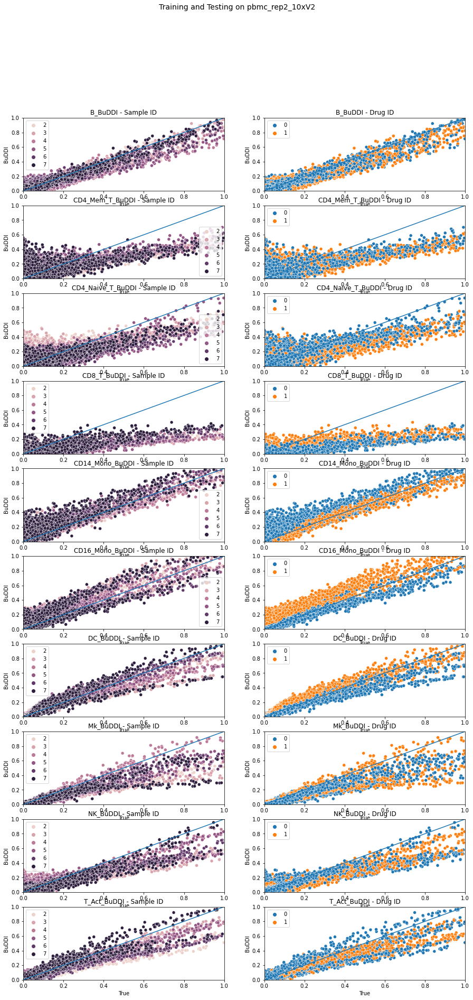

In [31]:
idx_tmp = np.where(Label_full >= 2)[0]
X_tmp = X_full[idx_tmp,]

# make predictions
prop_outputs = classifier.predict(X_tmp, batch_size=batch_size)

## plot for the unlabeled

prop_df = pd.DataFrame(prop_outputs, columns=Y_train.columns)
true_prop_df = Y_train.iloc[idx_tmp]

fig, axs = plt.subplots(10, 2, figsize=(15,30))
row_idx = 0
for curr_cell in true_prop_df.columns:

    plot_cell_specific_corr(true_prop_df[curr_cell], prop_df[curr_cell], axs[row_idx,0], title=f"{curr_cell}_BuDDI - Sample ID", xlab="True", ylab="BuDDI", class_id=Label_full[idx_tmp])
    plot_cell_specific_corr(true_prop_df[curr_cell], prop_df[curr_cell], axs[row_idx,1], title=f"{curr_cell}_BuDDI - Drug ID", xlab="True", ylab="BuDDI", class_id=Drug_full[idx_tmp])
    row_idx = row_idx +1


fig.suptitle("Training and Testing on pbmc_rep2_10xV2", fontsize=14)

fig.show()

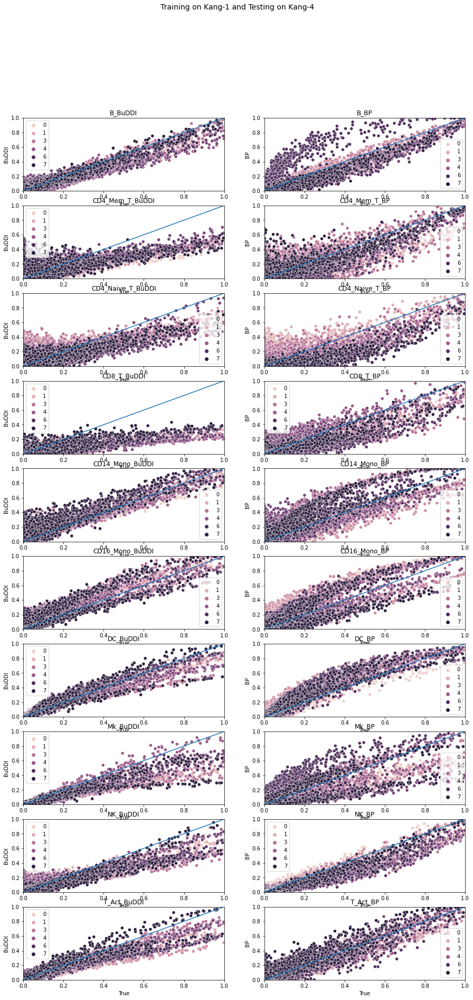

In [32]:
idx_tmp = idx_unlab
X_tmp = X_full[idx_tmp,]

y_cols = [str(x) for x in Y_train.columns]


# read in BP
bp_df  = read_bp_result_file(bp_res_path, "kang", "kang", num_samp=14000)
bp_df = bp_df.reindex(columns=y_cols, fill_value=0)


# make predictions
prop_outputs = classifier.predict(X_tmp, batch_size=batch_size)

## plot for the unlabeled
prop_df = pd.DataFrame(prop_outputs, columns=y_cols)
true_prop_df = Y_train.iloc[idx_tmp]



fig, axs = plt.subplots(10, 2, figsize=(15,30))
row_idx = 0
for curr_cell in true_prop_df.columns:

    plot_cell_specific_corr(true_prop_df[curr_cell], prop_df[curr_cell], axs[row_idx,0], title=f"{curr_cell}_BuDDI", xlab="True", ylab="BuDDI", class_id=Label_full[idx_tmp])
    plot_cell_specific_corr(true_prop_df[curr_cell], bp_df[curr_cell], axs[row_idx,1], title=f"{curr_cell}_BP", xlab="True", ylab="BP", class_id=Label_full[idx_tmp])
    row_idx = row_idx +1


fig.suptitle("Training on Kang-1 and Testing on Kang-4", fontsize=14)

fig.show()

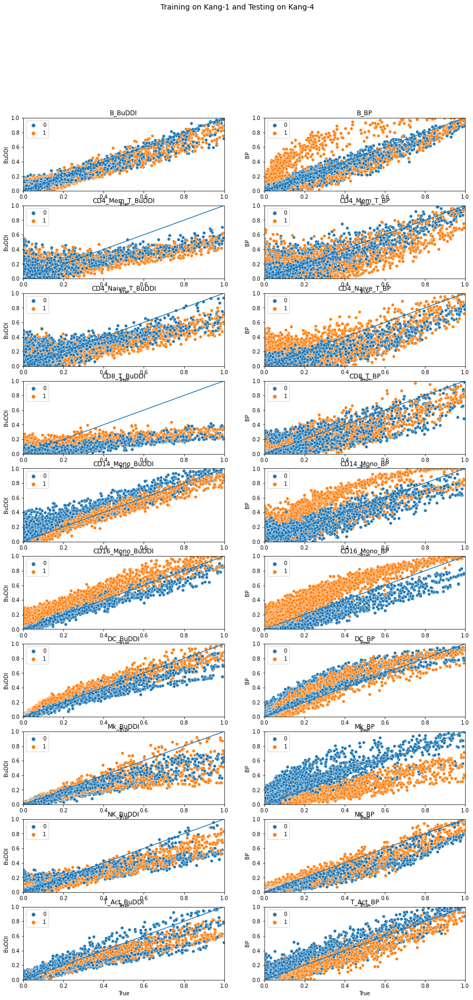

In [33]:
idx_tmp = idx_unlab
X_tmp = X_full[idx_tmp,]

y_cols = [str(x) for x in Y_train.columns]


# read in BP
bp_df  = read_bp_result_file(bp_res_path, "kang", "kang", num_samp=14000)
bp_df = bp_df.reindex(columns=y_cols, fill_value=0)


# make predictions
prop_outputs = classifier.predict(X_tmp, batch_size=batch_size)

## plot for the unlabeled
prop_df = pd.DataFrame(prop_outputs, columns=y_cols)
true_prop_df = Y_train.iloc[idx_tmp]



fig, axs = plt.subplots(10, 2, figsize=(15,30))
row_idx = 0
for curr_cell in true_prop_df.columns:

    plot_cell_specific_corr(true_prop_df[curr_cell], prop_df[curr_cell], axs[row_idx,0], title=f"{curr_cell}_BuDDI", xlab="True", ylab="BuDDI", class_id=Drug_full[idx_tmp])
    plot_cell_specific_corr(true_prop_df[curr_cell], bp_df[curr_cell], axs[row_idx,1], title=f"{curr_cell}_BP", xlab="True", ylab="BP", class_id=Drug_full[idx_tmp])
    row_idx = row_idx +1


fig.suptitle("Training on Kang-1 and Testing on Kang-4", fontsize=14)

fig.show()

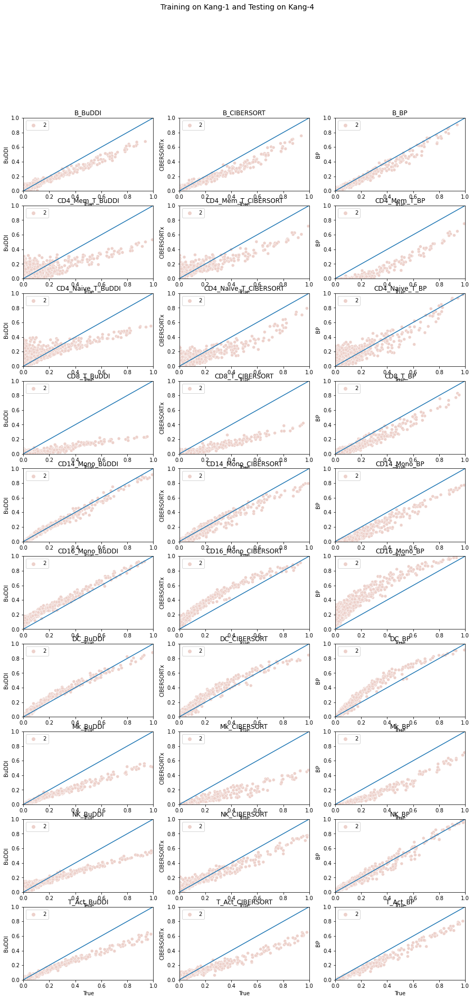

In [34]:
idx_9 = np.where(np.logical_and(Label_full == 2, Drug_full == 1))[0]
true_9_prop_df = Y_train.iloc[idx_9]
X_unkp_9 = X_full[idx_9,]

y_cols = [str(x) for x in Y_train.columns]


# read in cibersort
cibersort_df = pd.read_csv(cibersort_file_path)
cibersort_df = cibersort_df.reindex(columns=y_cols, fill_value=0)

# read in BP
bp_df  = read_bp_result_file(bp_res_path, "kang", "kang", num_samp=14000)
bp_df = bp_df.reindex(columns=y_cols, fill_value=0)
bp_df = bp_df.iloc[range(2000, 3000)] 


# make predictions
prop_outputs = classifier.predict(X_unkp_9, batch_size=batch_size)

## plot for the unlabeled
prop_df = pd.DataFrame(prop_outputs, columns=y_cols)
true_prop_df = Y_train.iloc[idx_9] # bp was run on unlabeled data only



fig, axs = plt.subplots(10, 3, figsize=(15,30))
row_idx = 0
for curr_cell in true_prop_df.columns:

    plot_cell_specific_corr(true_prop_df[curr_cell], prop_df[curr_cell], axs[row_idx,0], title=f"{curr_cell}_BuDDI", xlab="True", ylab="BuDDI", class_id=Label_full[idx_9])
    plot_cell_specific_corr(true_prop_df[curr_cell], cibersort_df[curr_cell], axs[row_idx,1], title=f"{curr_cell}_CIBERSORT", xlab="True", ylab="CIBERSORTx", class_id=Label_full[idx_9])
    plot_cell_specific_corr(true_prop_df[curr_cell], bp_df[curr_cell], axs[row_idx,2], title=f"{curr_cell}_BP", xlab="True", ylab="BP", class_id=Label_full[idx_9])
    row_idx = row_idx +1


fig.suptitle("Training on Kang-1 and Testing on Kang-4", fontsize=14)

fig.show()

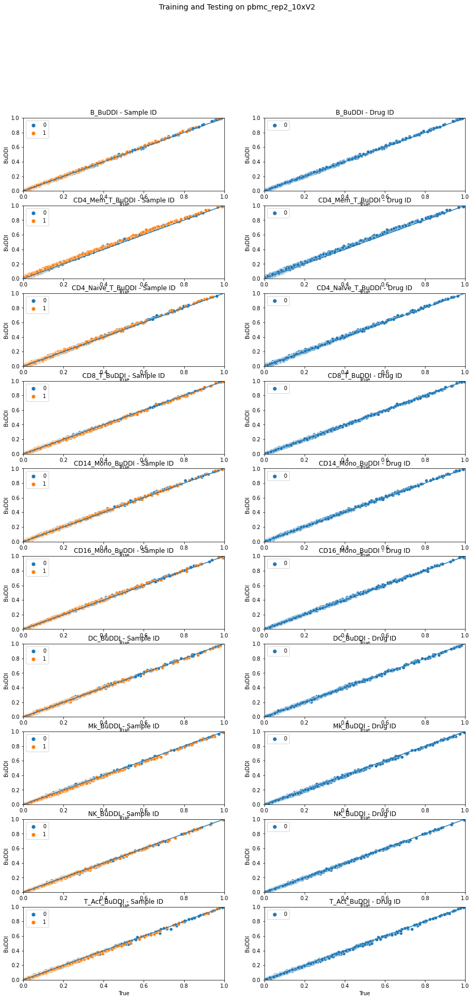

In [35]:
# make predictions
prop_outputs = classifier.predict(X_kp, batch_size=batch_size)


## plot for the labeled

prop_df = pd.DataFrame(prop_outputs, columns=Y_train.columns)
true_prop_df = Y_train.iloc[idx_train]

fig, axs = plt.subplots(10, 2, figsize=(15,30))
row_idx = 0
for curr_cell in true_prop_df.columns:

    plot_cell_specific_corr(true_prop_df[curr_cell], prop_df[curr_cell], axs[row_idx,0], title=f"{curr_cell}_BuDDI - Sample ID", xlab="True", ylab="BuDDI", class_id=Label_full[idx_train])
    plot_cell_specific_corr(true_prop_df[curr_cell], prop_df[curr_cell], axs[row_idx,1], title=f"{curr_cell}_BuDDI - Drug ID", xlab="True", ylab="BuDDI", class_id=Drug_full[idx_train])
    row_idx = row_idx +1


fig.suptitle("Training and Testing on pbmc_rep2_10xV2", fontsize=14)

fig.show()

### compare errors

In [36]:
def read_diva_result_file(res_path, train_id, test_id, unlab_id):
    res_file = os.path.join(res_path, f"train-{train_id}-test-{test_id}-DIVA.pkl")
    res_path = Path(res_file)
    res_df = pickle.load( open( res_path, "rb" ) )
    return res_df

def read_bp_result_file(res_path, train_id, test_id, num_samp=1000):
    res_file = os.path.join(res_path, f"train-{train_id}-test-{test_id}-bp_{num_samp}_init.tsv")
    res_df = pd.read_csv(res_file, sep="\t")
    return res_df

def read_bp_init_file(res_path, train_id, test_id, num_samp=1000):
    res_file = os.path.join(res_path, f"train-{train_id}-test-{test_id}-bp_{num_samp}_init.tsv")
    res_df = pd.read_csv(res_file, sep="\t")
    return res_df




In [37]:
# helper methods for evaluation
def sum_abs_error(y_pred, y_true):
  return sum(abs(y_pred - y_true))

def mean_abs_error(y_pred, y_true):
  return np.mean(abs(y_pred - y_true))

def mean_sqr_error(y_pred, y_true):
  return np.mean((y_pred - y_true)**2)

def get_errors(y_true, y_est):
  mse_err = [mean_sqr_error(y_true[idx], y_est[idx]) 
                  for idx in range(0, y_est.shape[0])]

  print(f"MSqE mean: {np.mean(mse_err)}, median: {np.median(mse_err)}, max: {max(mse_err)}")

  spr_err = [spearmanr(y_true[idx].astype(float), y_est[idx].astype(float))[0]
                    for idx in range(0, y_est.shape[0])]
  print(f"Spearman mean: {np.mean(spr_err)}, median: {np.median(spr_err)}, max: {max(spr_err)}")

  pear_err = [pearsonr(y_true[idx].astype(float), y_est[idx].astype(float))[0]
                    for idx in range(0, y_est.shape[0])]
  print(f"Pearson mean: {np.mean(pear_err)}, median: {np.median(pear_err)}, max: {max(pear_err)}")

  error_list = [mse_err, spr_err, pear_err]
  plot_df = [item for sublist in error_list for item in sublist]
  plot_df = pd.DataFrame(plot_df)
  plot_df.columns = ["error"]
  plot_df["error_type"] = ["MSQ"]*y_est.shape[0] + ["SPR"]*y_est.shape[0] + ["PEAR"]*y_est.shape[0]

  return plot_df


def get_errors_single(y_true, y_est):
  mse_err = [mean_sqr_error(y_true, y_est)]

  print(f"MSqE mean: {np.mean(mse_err)}, median: {np.median(mse_err)}, max: {max(mse_err)}")

  spr_err = [spearmanr(y_true, y_est)[0]]
  print(f"Spearman mean: {np.mean(spr_err)}, median: {np.median(spr_err)}, max: {max(spr_err)}")

  pear_err = [pearsonr(y_true, y_est)[0]]
  print(f"Pearson mean: {np.mean(pear_err)}, median: {np.median(pear_err)}, max: {max(pear_err)}")

  error_list = [mse_err, spr_err, pear_err]
  plot_df = [item for sublist in error_list for item in sublist]
  plot_df = pd.DataFrame(plot_df)
  plot_df.columns = ["error"]
  plot_df["error_type"] = ["MSQ"] + ["SPR"] + ["PEAR"]

  return plot_df




MSqE mean: 0.008284110812532285, median: 0.005415772065475368, max: 0.0667797931098919
Spearman mean: 0.6009624961409479, median: 0.6200636545536659, max: 0.9999999999999999
Pearson mean: 0.8076149517772498, median: 0.8669103299446641, max: 0.9999397265230048
MSqE mean: 0.00754102424956109, median: 0.005643528533330932, max: 0.04047349936563416
Spearman mean: 0.6106129043582464, median: 0.6438362796138488, max: 0.9726488698881034
Pearson mean: 0.819919835507724, median: 0.8651212403328526, max: 0.9991240141118263
MSqE mean: 0.007939608641047357, median: 0.007089837260334573, max: 0.025752037281304457
Spearman mean: 0.5995833638757007, median: 0.6331899480395677, max: 0.9969650916353059
Pearson mean: 0.7953070575173165, median: 0.8501872327026927, max: 0.9999727230981671


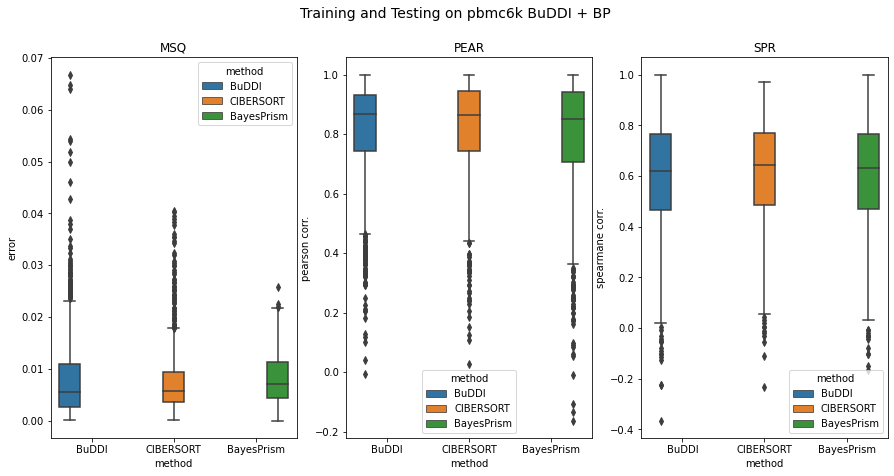

In [38]:
# We only ran the cibersort on index 9
idx_9 = np.where(np.logical_and(Label_full == 2, Drug_full == 1))[0]
X_tmp = X_full[idx_9,]
Y_tmp = Y_train.iloc[idx_9]

# make predictions
prop_outputs = classifier.predict(X_tmp, batch_size=batch_size)

# read in cibersort
cibersort_df = pd.read_csv(cibersort_file_path)
cibersort_df = cibersort_df.reindex(columns=Y_train.columns, fill_value=0)


# read in BP
bp_df  = read_bp_result_file(bp_res_path, "kang", "kang", num_samp=14000)
bp_df = bp_df.reindex(columns=y_cols, fill_value=0)
bp_df = bp_df.iloc[range(2000, 3000)] 


# calculate the error
buddi_err = get_errors(Y_tmp.to_numpy(), prop_outputs)
cibersort_err = get_errors(Y_tmp.to_numpy(), cibersort_df.to_numpy())
bp_err = get_errors(Y_tmp.to_numpy(), bp_df.to_numpy())

# format the errors
buddi_err["experiment"] = ["true_val"]*buddi_err.shape[0]
buddi_err["method"] = ["BuDDI"]*buddi_err.shape[0]

cibersort_err["experiment"] = ["true_val"]*cibersort_err.shape[0]
cibersort_err["method"] = ["CIBERSORT"]*cibersort_err.shape[0]

bp_err["experiment"] = ["true_val"]*bp_err.shape[0]
bp_err["method"] = ["BayesPrism"]*bp_err.shape[0]

plot_df = pd.concat([buddi_err, cibersort_err, bp_err])

# plot
fig, axs = plt.subplots(1, 3, figsize=(15,7))
sns.boxplot(data=plot_df[plot_df["error_type"] == "MSQ"], 
            x="method", y="error",
            hue="method", ax= axs[0])
axs[0].set_title("MSQ")

sns.boxplot(data=plot_df[plot_df["error_type"] == "PEAR"], 
            x="method", y="error",
            hue="method", ax= axs[1])
axs[1].set_title("PEAR")
axs[1].set(ylabel="pearson corr.")
fig.suptitle("Training on 1, testing on 4", fontsize=14)


sns.boxplot(data=plot_df[plot_df["error_type"] == "SPR"], 
            x="method", y="error",
            hue="method", ax= axs[2])
axs[2].set_title("SPR")
axs[2].set(ylabel="spearmane corr.")
fig.suptitle("Training and Testing on pbmc6k BuDDI + BP", fontsize=14)


fig.show()

MSqE mean: 0.007911986208150243, median: 0.004942629524993692, max: 0.08541568046486141
Spearman mean: 0.6188882664637275, median: 0.6585441523620312, max: 0.9999999999999999
Pearson mean: 0.8226160026358267, median: 0.8795322834374467, max: 0.9999863695325268
MSqE mean: 0.008326024085374072, median: 0.006861981662131152, max: 0.08985465019738426
Spearman mean: 0.590181615747806, median: 0.6200636545536659, max: 0.9999999999999999
Pearson mean: 0.7917239133053747, median: 0.8609299921325921, max: 0.9999996976390028


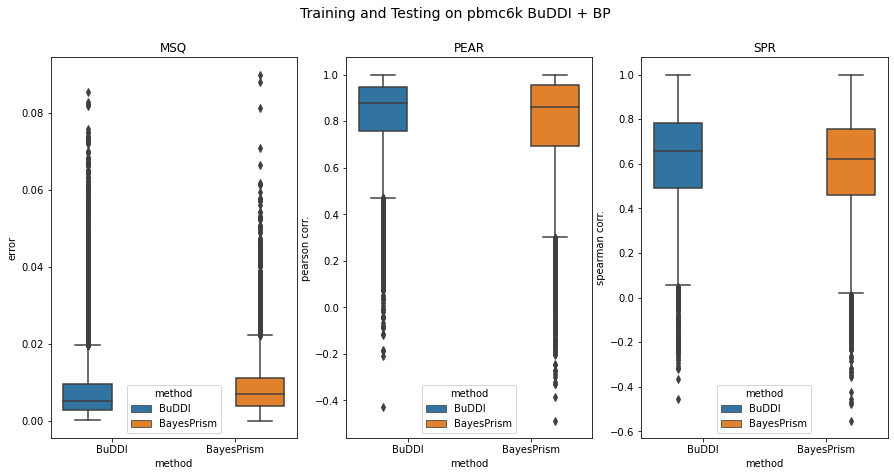

In [39]:

X_tmp = X_full[idx_tmp,]
Y_tmp = Y_train.iloc[idx_tmp]

# make predictions
prop_outputs = classifier.predict(X_tmp, batch_size=batch_size)

# read in BP
bp_df  = read_bp_result_file(bp_res_path, "kang", "kang", num_samp=14000)
bp_df = bp_df.reindex(columns=y_cols, fill_value=0)


# calculate the error
buddi_err = get_errors(Y_tmp.to_numpy(), prop_outputs)
bp_err = get_errors(Y_tmp.to_numpy(), bp_df.to_numpy())

# format the errors
buddi_err["experiment"] = ["true_val"]*buddi_err.shape[0]
buddi_err["method"] = ["BuDDI"]*buddi_err.shape[0]

bp_err["experiment"] = ["true_val"]*bp_err.shape[0]
bp_err["method"] = ["BayesPrism"]*bp_err.shape[0]

plot_df = pd.concat([buddi_err, bp_err])

# plot
fig, axs = plt.subplots(1, 3, figsize=(15,7))
sns.boxplot(data=plot_df[plot_df["error_type"] == "MSQ"], 
            x="method", y="error",
            hue="method", ax= axs[0])
axs[0].set_title("MSQ")

sns.boxplot(data=plot_df[plot_df["error_type"] == "PEAR"], 
            x="method", y="error",
            hue="method", ax= axs[1])
axs[1].set_title("PEAR")
axs[1].set(ylabel="pearson corr.")
fig.suptitle("Training on 1, testing on 4", fontsize=14)


sns.boxplot(data=plot_df[plot_df["error_type"] == "SPR"], 
            x="method", y="error",
            hue="method", ax= axs[2])
axs[2].set_title("SPR")
axs[2].set(ylabel="spearman corr.")
fig.suptitle("Training and Testing on pbmc6k BuDDI + BP", fontsize=14)


fig.show()

MSqE mean: 0.007911986208150243, median: 0.004942629524993692, max: 0.08541568046486141
Spearman mean: 0.6188882664637275, median: 0.6585441523620312, max: 0.9999999999999999
Pearson mean: 0.8226160026358267, median: 0.8795322834374467, max: 0.9999863695325268
MSqE mean: 0.008326024085374072, median: 0.006861981662131152, max: 0.08985465019738426
Spearman mean: 0.590181615747806, median: 0.6200636545536659, max: 0.9999999999999999
Pearson mean: 0.7917239133053747, median: 0.8609299921325921, max: 0.9999996976390028


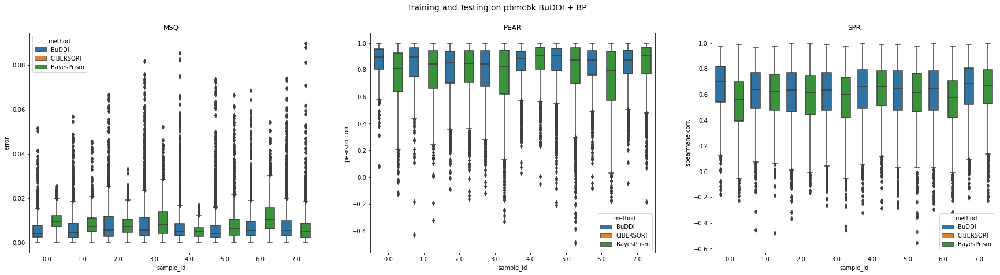

In [40]:
# Now compare across samples
idx_tmp = idx_unlab
num_unlab = np.array([0,1,2,2,3,3,4,4,5,5,6,6,7,7])
idx_tmp = idx_unlab
X_tmp = X_full[idx_tmp,]
Y_tmp = Y_train.iloc[idx_tmp]

# make predictions
prop_outputs = classifier.predict(X_tmp, batch_size=batch_size)

# calculate the error
buddi_err = get_errors(Y_tmp.to_numpy(), prop_outputs)
bp_err = get_errors(Y_tmp.to_numpy(), bp_df.to_numpy())


# format the errors
buddi_err["experiment"] = ["true_val"]*buddi_err.shape[0]
buddi_err["method"] = ["BuDDI"]*buddi_err.shape[0]
buddi_err["sample_id"] = np.tile(np.repeat(num_unlab, 1000), 3)

bp_err["experiment"] = ["true_val"]*bp_err.shape[0]
bp_err["method"] = ["BayesPrism"]*bp_err.shape[0]
bp_err["sample_id"] = np.tile(np.repeat(num_unlab, 1000), 3)

plot_df = pd.concat([buddi_err, cibersort_err, bp_err])



# plot
fig, axs = plt.subplots(1, 3, figsize=(30,7))
sns.boxplot(data=plot_df[plot_df["error_type"] == "MSQ"], 
            x="sample_id", y="error",
            hue="method", ax= axs[0])
axs[0].set_title("MSQ")

sns.boxplot(data=plot_df[plot_df["error_type"] == "PEAR"], 
            x="sample_id", y="error",
            hue="method", ax= axs[1])
axs[1].set_title("PEAR")
axs[1].set(ylabel="pearson corr.")


sns.boxplot(data=plot_df[plot_df["error_type"] == "SPR"], 
            x="sample_id", y="error",
            hue="method", ax= axs[2])
axs[2].set_title("SPR")
axs[2].set(ylabel="spearmane corr.")
fig.suptitle("Training and Testing on pbmc6k BuDDI + BP", fontsize=14)

fig.show()

# **Inspect the output**

## TSNE training data

Now that we know what is expected, let's see what we get from the model. We find that out of our encoder, after applying ReLU, we get pretty close to the expected proportions.

In [41]:
import umap

def get_umap_for_plotting(encodings):
    fit = umap.UMAP()
    umap_results = fit.fit_transform(encodings)

    plot_df = pd.DataFrame(umap_results[:,0:2])
    print(umap_results.shape)
    print(plot_df.shape)
    plot_df.columns = ['umap_0', 'umap_1']
    return plot_df

def plot_umap(plot_df, color_vec, ax, title="", alpha=0.3):

    plot_df['Y'] = color_vec

    g = sns.scatterplot(
        x="umap_0", y="umap_1",
        data=plot_df,
        hue="Y",
        palette=sns.color_palette("hls", len(np.unique(color_vec))),
        legend="full",
        alpha=alpha, ax= ax
    )

    ax.set_title(title)
    return g


In [42]:
def get_tsne_for_plotting(encodings):
    tsne = TSNE(n_components=2, verbose=1, perplexity=20, n_iter=500)
    tsne_results = tsne.fit_transform(encodings)

    plot_df = pd.DataFrame(tsne_results[:,0:2])
    print(tsne_results.shape)
    print(plot_df.shape)
    plot_df.columns = ['tsne_0', 'tsne_1']
    return plot_df

def plot_tsne(plot_df, color_vec, ax, title=""):

    plot_df['Y'] = color_vec

    g = sns.scatterplot(
        x="tsne_0", y="tsne_1",
        data=plot_df,
        hue="Y",
        palette=sns.color_palette("hls", len(np.unique(color_vec))),
        legend="full",
        alpha=0.3, ax= ax
    )

    ax.set_title(title)
    return g


In [43]:
from sklearn.decomposition import PCA

def get_pca_for_plotting(encodings):
    fit = PCA(n_components=2)
    pca_results = fit.fit_transform(encodings)

    plot_df = pd.DataFrame(pca_results[:,0:2])
    print(pca_results.shape)
    print(plot_df.shape)
    plot_df.columns = ['PCA_0', 'PCA_1']
    return plot_df

def plot_pca(plot_df, color_vec, ax, title=""):

    plot_df['Y'] = color_vec

    g = sns.scatterplot(
        x="PCA_0", y="PCA_1",
        data=plot_df,
        hue="Y",
        palette=sns.color_palette("hls", len(np.unique(color_vec))),
        legend="full",
        alpha=0.1, ax= ax
    )

    ax.set_title(title)
    return g

## Plot Reconstruction

In [44]:

X_temp = np.copy(X_full)


label_temp = np.copy(Label_full)
perturb_temp = Drug_full
source_temp = np.asarray([0]*10000)


# now use the encoder to get the latent spaces
z_slack, mu_slack, l_sigma_slack, z_rot, mu_rot, l_sigma_rot, z_drug, mu_drug, l_sigma_drug = encoder_unlab.predict(X_temp, batch_size=batch_size)

# now concatenate together
z_concat = np.hstack([z_slack, Y_train, z_rot, z_drug])

# and decode
decoded_outputs = decoder.predict(z_concat, batch_size=batch_size)


/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/keras/engine/training.py:2470: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


(16000, 2)
(16000, 2)


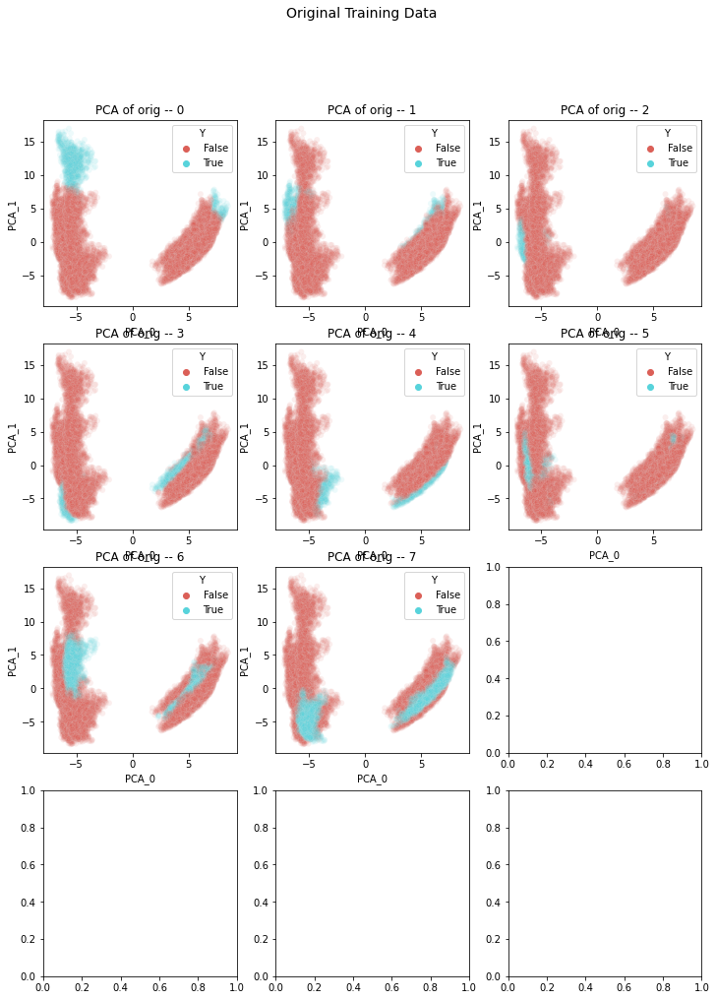

In [45]:

fig, axs = plt.subplots(4, 3, figsize=(12,16))

plot_df = get_pca_for_plotting(np.asarray(X_temp))
plot_pca(plot_df, color_vec=label_temp==0, ax=axs[0,0], title="PCA of orig -- 0")
plot_pca(plot_df, color_vec=label_temp==1, ax=axs[0,1], title="PCA of orig -- 1")
plot_pca(plot_df, color_vec=label_temp==2, ax=axs[0,2], title="PCA of orig -- 2")
plot_pca(plot_df, color_vec=label_temp==3, ax=axs[1,0], title="PCA of orig -- 3")
plot_pca(plot_df, color_vec=label_temp==4, ax=axs[1,1], title="PCA of orig -- 4")
plot_pca(plot_df, color_vec=label_temp==5, ax=axs[1,2], title="PCA of orig -- 5")
plot_pca(plot_df, color_vec=label_temp==6, ax=axs[2,0], title="PCA of orig -- 6")
plot_pca(plot_df, color_vec=label_temp==7, ax=axs[2,1], title="PCA of orig -- 7")


fig.suptitle("Original Training Data", fontsize=14)

fig.show()

(16000, 2)
(16000, 2)


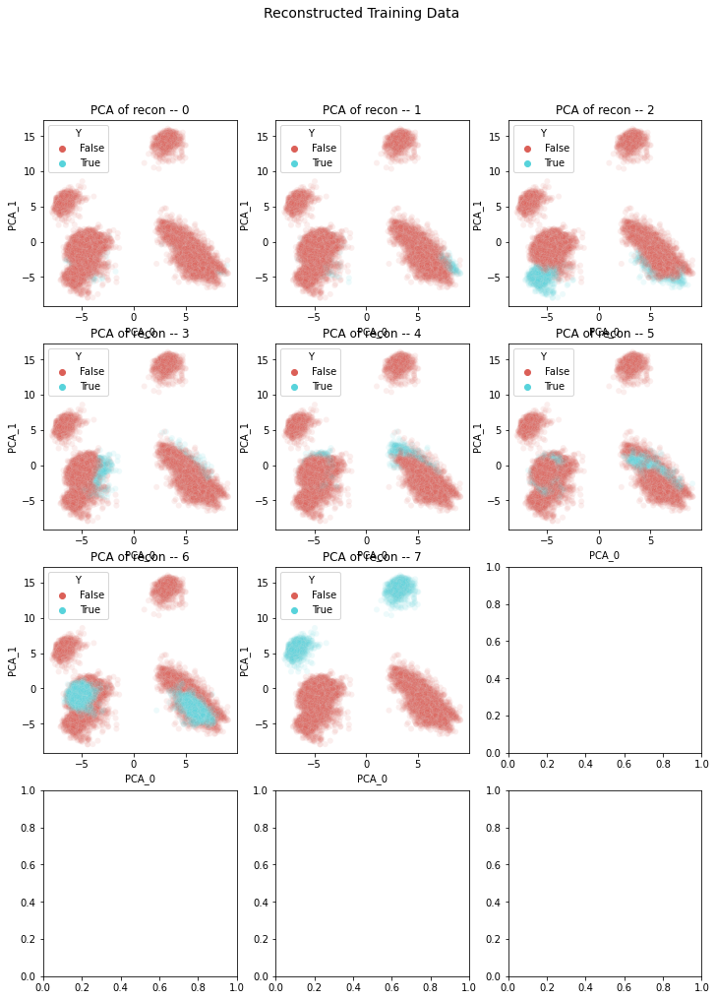

In [46]:

fig, axs = plt.subplots(4, 3, figsize=(12,16))

plot_df = get_pca_for_plotting(np.asarray(decoded_outputs))
plot_pca(plot_df, color_vec=label_temp==0, ax=axs[0,0], title="PCA of recon -- 0")
plot_pca(plot_df, color_vec=label_temp==1, ax=axs[0,1], title="PCA of recon -- 1")
plot_pca(plot_df, color_vec=label_temp==2, ax=axs[0,2], title="PCA of recon -- 2")
plot_pca(plot_df, color_vec=label_temp==3, ax=axs[1,0], title="PCA of recon -- 3")
plot_pca(plot_df, color_vec=label_temp==4, ax=axs[1,1], title="PCA of recon -- 4")
plot_pca(plot_df, color_vec=label_temp==5, ax=axs[1,2], title="PCA of recon -- 5")
plot_pca(plot_df, color_vec=label_temp==6, ax=axs[2,0], title="PCA of recon -- 6")
plot_pca(plot_df, color_vec=label_temp==7, ax=axs[2,1], title="PCA of recon -- 7")


fig.suptitle("Reconstructed Training Data", fontsize=14)

fig.show()

(32000, 2)
(32000, 2)


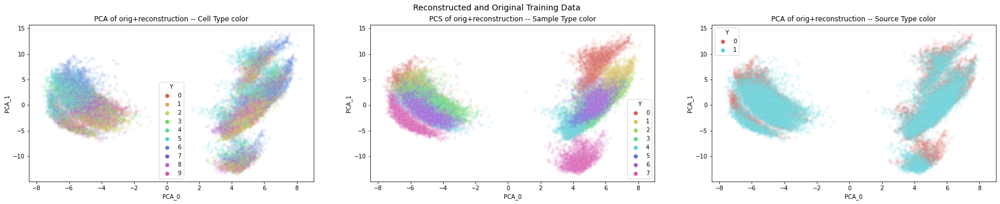

In [47]:
# make duplicated
X_dup = np.vstack([X_temp, decoded_outputs])


Y_temp = np.copy(Y_train)
Y_temp = np.argmax(Y_temp, axis=1)
Y_dup = np.append(Y_temp, Y_temp)

label_dup = np.append(label_temp, label_temp)
perturb_dup = np.append(perturb_temp, perturb_temp)
source_dup = np.asarray(np.append([0]*16000, [1]*16000))

fig, axs = plt.subplots(1, 3, figsize=(30,5))

plot_df = get_pca_for_plotting(np.asarray(X_dup))
plot_pca(plot_df, color_vec=Y_dup, ax=axs[0], title="PCA of orig+reconstruction -- Cell Type color")
plot_pca(plot_df, color_vec=label_dup, ax=axs[1], title="PCS of orig+reconstruction -- Sample Type color")
plot_pca(plot_df, color_vec=source_dup, ax=axs[2], title="PCA of orig+reconstruction -- Source Type color")


fig.suptitle("Reconstructed and Original Training Data", fontsize=14)

fig.show()

### Plot latent spaces

Number unique Y: 10


OMP: Info #273: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


(14000, 2)
(14000, 2)
(14000, 2)
(14000, 2)
(14000, 2)
(14000, 2)
(14000, 2)
(14000, 2)
(14000, 2)
(14000, 2)


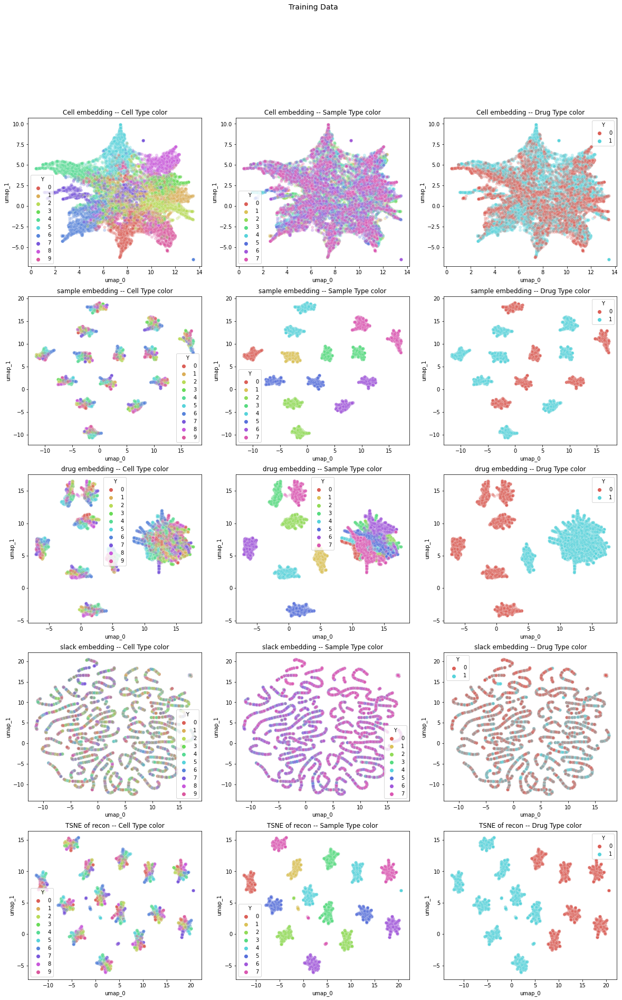

In [48]:
# plot proportions on labeled 10x and unlabeled 10x
# this is the training data
idx_tmp = idx_unlab

X_temp = np.copy(X_full)
X_temp = X_temp[idx_tmp,]

Y_temp = np.copy(Y_train)
Y_temp = np.argmax(Y_temp, axis=1)
Y_temp = Y_temp[idx_tmp]

label_temp = np.copy(Label_full)
label_temp = label_temp[idx_tmp]

perturb_temp =np.copy(Drug_full)
perturb_temp = perturb_temp[idx_tmp]

print(f"Number unique Y: {len(np.unique(Y_temp))}")


z_slack, mu_slack, l_sigma_slack, z_rot, mu_rot, l_sigma_rot, z_drug, mu_drug, l_sigma_drug = encoder_unlab.predict(X_temp, batch_size=batch_size)
prop_outputs = classifier.predict(X_temp, batch_size=batch_size)


# now concatenate together
z_concat = np.hstack([z_slack, prop_outputs, z_rot, z_drug])

# and decode
decoded_outputs = decoder.predict(z_concat, batch_size=batch_size)


fig, axs = plt.subplots(5, 3, figsize=(20,30))

plot_df = get_umap_for_plotting(np.asarray(prop_outputs))
plot_umap(plot_df, color_vec=Y_temp, ax=axs[0,0], title="Cell embedding -- Cell Type color")
plot_umap(plot_df, color_vec=label_temp, ax=axs[0,1], title="Cell embedding -- Sample Type color")
plot_umap(plot_df, color_vec=perturb_temp, ax=axs[0,2], title="Cell embedding -- Drug Type color")

plot_df = get_umap_for_plotting(np.asarray(mu_rot))
plot_umap(plot_df, color_vec=Y_temp, ax=axs[1,0], title="sample embedding -- Cell Type color")
plot_umap(plot_df, color_vec=label_temp, ax=axs[1,1], title="sample embedding -- Sample Type color")
plot_umap(plot_df, color_vec=perturb_temp, ax=axs[1,2], title="sample embedding -- Drug Type color")

plot_df = get_umap_for_plotting(np.asarray(mu_drug))
plot_umap(plot_df, color_vec=Y_temp, ax=axs[2,0], title="drug embedding -- Cell Type color")
plot_umap(plot_df, color_vec=label_temp, ax=axs[2,1], title="drug embedding -- Sample Type color")
plot_umap(plot_df, color_vec=perturb_temp, ax=axs[2,2], title="drug embedding -- Drug Type color")

plot_df = get_umap_for_plotting(np.asarray(mu_slack))
plot_umap(plot_df, color_vec=Y_temp, ax=axs[3,0], title="slack embedding -- Cell Type color")
plot_umap(plot_df, color_vec=label_temp, ax=axs[3,1], title="slack embedding -- Sample Type color")
plot_umap(plot_df, color_vec=perturb_temp, ax=axs[3,2], title="slack embedding -- Drug Type color")

plot_df = get_umap_for_plotting(np.asarray(decoded_outputs))
plot_umap(plot_df, color_vec=Y_temp, ax=axs[4,0], title="TSNE of recon -- Cell Type color")
plot_umap(plot_df, color_vec=label_temp, ax=axs[4,1], title="TSNE of recon -- Sample Type color")
plot_umap(plot_df, color_vec=perturb_temp, ax=axs[4,2], title="TSNE of recon -- Drug Type color")




fig.suptitle("Training Data", fontsize=14)

fig.show()

Number unique Y: 10
(14000, 2)
(14000, 2)
(14000, 2)
(14000, 2)
(14000, 2)
(14000, 2)
(14000, 2)
(14000, 2)
(14000, 2)
(14000, 2)


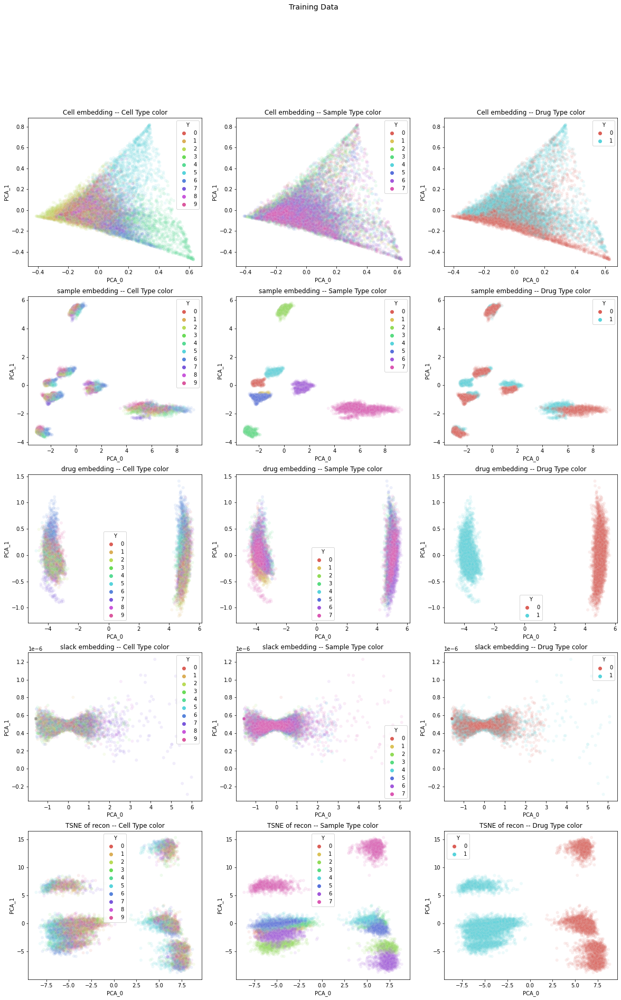

In [49]:
# plot proportions on labeled 10x and unlabeled 10x
# this is the training data
idx_tmp = idx_unlab

X_temp = np.copy(X_full)
X_temp = X_temp[idx_tmp,]

Y_temp = np.copy(Y_train)
Y_temp = np.argmax(Y_temp, axis=1)
Y_temp = Y_temp[idx_tmp]

label_temp = np.copy(Label_full)
label_temp = label_temp[idx_tmp]

perturb_temp =np.copy(Drug_full)
perturb_temp = perturb_temp[idx_tmp]

print(f"Number unique Y: {len(np.unique(Y_temp))}")


z_slack, mu_slack, l_sigma_slack, z_rot, mu_rot, l_sigma_rot, z_drug, mu_drug, l_sigma_drug = encoder_unlab.predict(X_temp, batch_size=batch_size)
prop_outputs = classifier.predict(X_temp, batch_size=batch_size)


# now concatenate together
z_concat = np.hstack([z_slack, prop_outputs, z_rot, z_drug])

# and decode
decoded_outputs = decoder.predict(z_concat, batch_size=batch_size)


fig, axs = plt.subplots(5, 3, figsize=(20,30))

plot_df = get_pca_for_plotting(np.asarray(prop_outputs))
plot_pca(plot_df, color_vec=Y_temp, ax=axs[0,0], title="Cell embedding -- Cell Type color")
plot_pca(plot_df, color_vec=label_temp, ax=axs[0,1], title="Cell embedding -- Sample Type color")
plot_pca(plot_df, color_vec=perturb_temp, ax=axs[0,2], title="Cell embedding -- Drug Type color")

plot_df = get_pca_for_plotting(np.asarray(mu_rot))
plot_pca(plot_df, color_vec=Y_temp, ax=axs[1,0], title="sample embedding -- Cell Type color")
plot_pca(plot_df, color_vec=label_temp, ax=axs[1,1], title="sample embedding -- Sample Type color")
plot_pca(plot_df, color_vec=perturb_temp, ax=axs[1,2], title="sample embedding -- Drug Type color")

plot_df = get_pca_for_plotting(np.asarray(mu_drug))
plot_pca(plot_df, color_vec=Y_temp, ax=axs[2,0], title="drug embedding -- Cell Type color")
plot_pca(plot_df, color_vec=label_temp, ax=axs[2,1], title="drug embedding -- Sample Type color")
plot_pca(plot_df, color_vec=perturb_temp, ax=axs[2,2], title="drug embedding -- Drug Type color")

plot_df = get_pca_for_plotting(np.asarray(mu_slack))
plot_pca(plot_df, color_vec=Y_temp, ax=axs[3,0], title="slack embedding -- Cell Type color")
plot_pca(plot_df, color_vec=label_temp, ax=axs[3,1], title="slack embedding -- Sample Type color")
plot_pca(plot_df, color_vec=perturb_temp, ax=axs[3,2], title="slack embedding -- Drug Type color")

plot_df = get_pca_for_plotting(np.asarray(decoded_outputs))
plot_pca(plot_df, color_vec=Y_temp, ax=axs[4,0], title="TSNE of recon -- Cell Type color")
plot_pca(plot_df, color_vec=label_temp, ax=axs[4,1], title="TSNE of recon -- Sample Type color")
plot_pca(plot_df, color_vec=perturb_temp, ax=axs[4,2], title="TSNE of recon -- Drug Type color")




fig.suptitle("Training Data", fontsize=14)

fig.show()

Number unique Y: 10
(14000, 2)
(14000, 2)


/tmp/ipykernel_345899/563184163.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plot_df['Y'] = color_vec
/tmp/ipykernel_345899/563184163.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plot_df['Y'] = color_vec
/tmp/ipykernel_345899/563184163.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.h

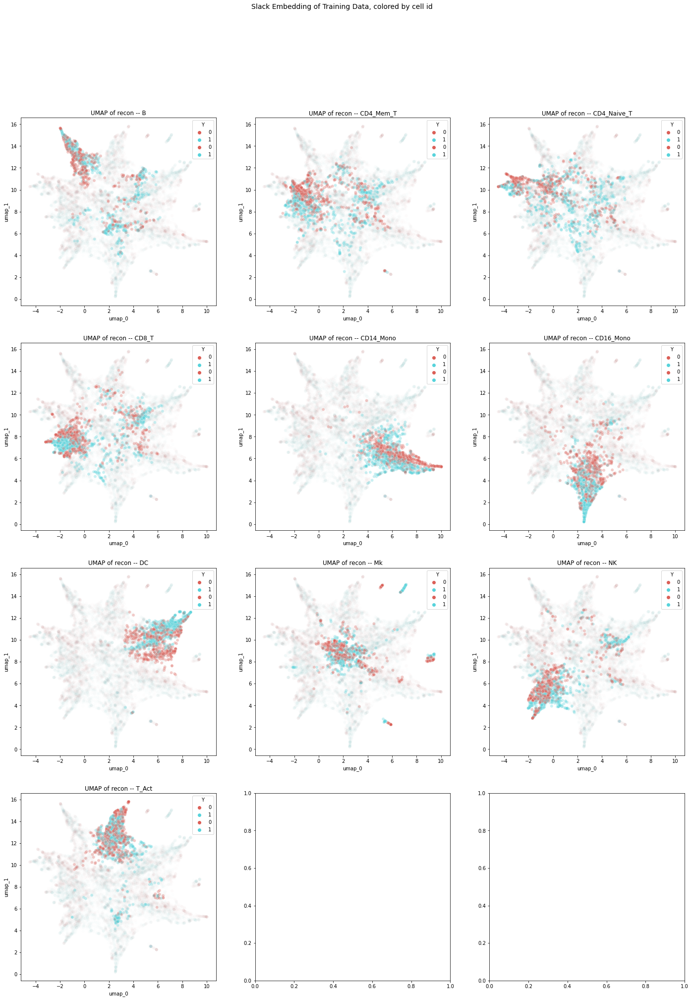

In [50]:

# plot proportions on labeled 10x and unlabeled 10x
# this is the training data

# plot proportions on labeled 10x and unlabeled 10x
# this is the training data
idx_tmp = idx_unlab

X_temp = np.copy(X_full)
X_temp = X_temp[idx_tmp,]

Y_temp = np.copy(Y_train)
Y_temp = np.argmax(Y_temp, axis=1)
Y_temp = Y_temp[idx_tmp]

label_temp = np.copy(Label_full)
label_temp = label_temp[idx_tmp]

perturb_temp =np.copy(Drug_full)
perturb_temp = perturb_temp[idx_tmp]


print(f"Number unique Y: {len(np.unique(Y_temp))}")

prop_outputs = classifier.predict(X_temp, batch_size=batch_size)

#z_slack, mu_slack, l_sigma_slack, z_rot, mu_rot, l_sigma_rot = pbmc6k_enc_unlab.predict(X_temp, batch_size=batch_size)

fig, axs = plt.subplots(4, 3, figsize=(24,32))

plot_df = get_umap_for_plotting(np.asarray(prop_outputs))

plot_umap(plot_df, color_vec=perturb_temp, ax=axs[0,0], alpha=0.01)
plot_umap(plot_df.iloc[np.where(Y_temp == 0)], color_vec=perturb_temp[np.where(Y_temp == 0)], ax=axs[0,0], title=f"UMAP of recon -- {Y_train.columns[0]}")

plot_umap(plot_df, color_vec=perturb_temp, ax=axs[0,1], alpha=0.01)
plot_umap(plot_df.iloc[np.where(Y_temp == 1)], color_vec=perturb_temp[np.where(Y_temp == 1)], ax=axs[0,1], title=f"UMAP of recon -- {Y_train.columns[1]}")

plot_umap(plot_df, color_vec=perturb_temp, ax=axs[0,2], alpha=0.01)
plot_umap(plot_df.iloc[np.where(Y_temp == 2)], color_vec=perturb_temp[np.where(Y_temp == 2)], ax=axs[0,2], title=f"UMAP of recon -- {Y_train.columns[2]}")

plot_umap(plot_df, color_vec=perturb_temp, ax=axs[1,0], alpha=0.01)
plot_umap(plot_df.iloc[np.where(Y_temp == 3)], color_vec=perturb_temp[np.where(Y_temp == 3)], ax=axs[1,0], title=f"UMAP of recon -- {Y_train.columns[3]}")

plot_umap(plot_df, color_vec=perturb_temp, ax=axs[1,1], alpha=0.01)
plot_umap(plot_df.iloc[np.where(Y_temp == 4)], color_vec=perturb_temp[np.where(Y_temp == 4)], ax=axs[1,1], title=f"UMAP of recon -- {Y_train.columns[4]}")

plot_umap(plot_df, color_vec=perturb_temp, ax=axs[1,2], alpha=0.01)
plot_umap(plot_df.iloc[np.where(Y_temp == 5)], color_vec=perturb_temp[np.where(Y_temp == 5)], ax=axs[1,2], title=f"UMAP of recon -- {Y_train.columns[5]}")

plot_umap(plot_df, color_vec=perturb_temp, ax=axs[2,0], alpha=0.01)
plot_umap(plot_df.iloc[np.where(Y_temp == 6)], color_vec=perturb_temp[np.where(Y_temp == 6)], ax=axs[2,0], title=f"UMAP of recon -- {Y_train.columns[6]}")


plot_umap(plot_df, color_vec=perturb_temp, ax=axs[2,1], alpha=0.01)
plot_umap(plot_df.iloc[np.where(Y_temp == 7)], color_vec=perturb_temp[np.where(Y_temp == 7)], ax=axs[2,1], title=f"UMAP of recon -- {Y_train.columns[7]}")


plot_umap(plot_df, color_vec=perturb_temp, ax=axs[2,2], alpha=0.01)
plot_umap(plot_df.iloc[np.where(Y_temp == 8)], color_vec=perturb_temp[np.where(Y_temp == 8)], ax=axs[2,2], title=f"UMAP of recon -- {Y_train.columns[8]}")


plot_umap(plot_df, color_vec=perturb_temp, ax=axs[3,0], alpha=0.01)
plot_umap(plot_df.iloc[np.where(Y_temp == 9)], color_vec=perturb_temp[np.where(Y_temp == 9)], ax=axs[3,0], title=f"UMAP of recon -- {Y_train.columns[9]}")

fig.suptitle("Slack Embedding of Training Data, colored by cell id", fontsize=14)

fig.show()

Number unique Y: 10
(16000, 2)
(16000, 2)


/tmp/ipykernel_345899/563184163.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plot_df['Y'] = color_vec
/tmp/ipykernel_345899/563184163.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plot_df['Y'] = color_vec
/tmp/ipykernel_345899/563184163.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.h

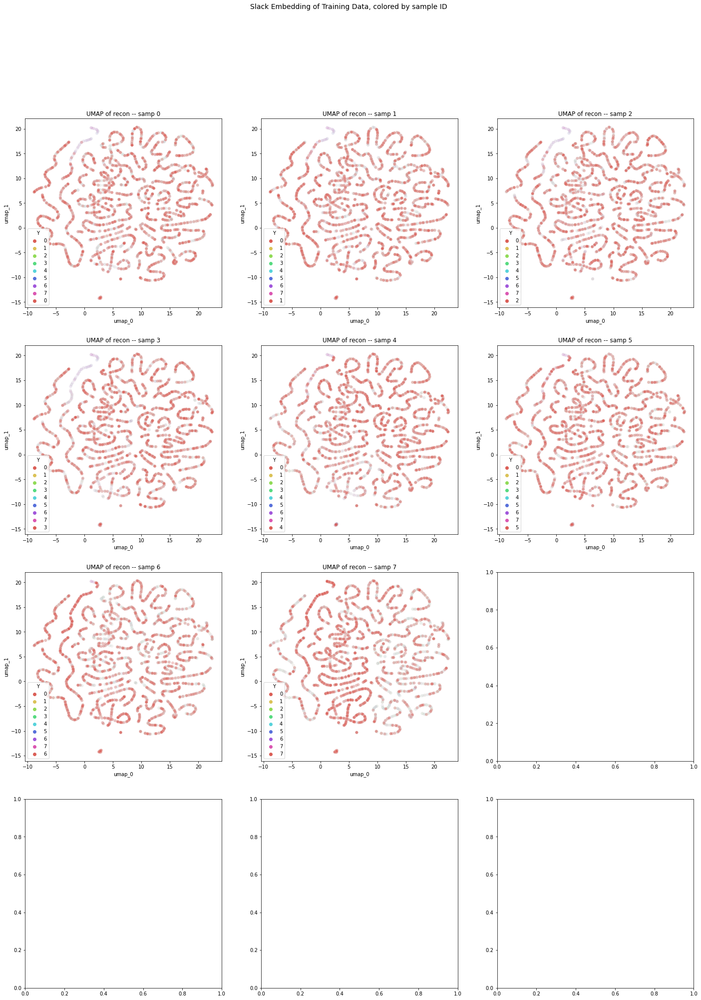

In [51]:

# plot proportions on labeled 10x and unlabeled 10x
# this is the training data

X_temp = np.copy(X_full)

Y_temp = np.copy(Y_train)
Y_temp = np.argmax(Y_temp, axis=1)

label_temp = np.copy(Label_full)
perturb_temp = Drug_full

print(f"Number unique Y: {len(np.unique(Y_temp))}")


z_slack, mu_slack, l_sigma_slack, z_rot, mu_rot, l_sigma_rot, z_drug, mu_drug, l_sigma_drug = encoder_unlab.predict(X_temp, batch_size=batch_size)

fig, axs = plt.subplots(4, 3, figsize=(24,32))

plot_df = get_umap_for_plotting(np.asarray(mu_slack))

plot_umap(plot_df, color_vec=label_temp, ax=axs[0,0], title="UMAP of recon -- samp 0", alpha=0.01)
plot_umap(plot_df.iloc[np.where(label_temp == 0)], color_vec=label_temp[np.where(label_temp == 0)], ax=axs[0,0], title="UMAP of recon -- samp 0")

plot_umap(plot_df, color_vec=label_temp, ax=axs[0,1], title="UMAP of recon -- samp 1", alpha=0.01)
plot_umap(plot_df.iloc[np.where(label_temp == 1)], color_vec=label_temp[np.where(label_temp == 1)], ax=axs[0,1], title="UMAP of recon -- samp 1")

plot_umap(plot_df, color_vec=label_temp, ax=axs[0,2], title="UMAP of recon -- samp 2", alpha=0.01)
plot_umap(plot_df.iloc[np.where(label_temp == 2)], color_vec=label_temp[np.where(label_temp == 2)], ax=axs[0,2], title="UMAP of recon -- samp 2")

plot_umap(plot_df, color_vec=label_temp, ax=axs[1,0], title="UMAP of recon -- samp 3", alpha=0.01)
plot_umap(plot_df.iloc[np.where(label_temp == 3)], color_vec=label_temp[np.where(label_temp == 3)], ax=axs[1,0], title="UMAP of recon -- samp 3")

plot_umap(plot_df, color_vec=label_temp, ax=axs[1,1], title="UMAP of recon -- samp 4", alpha=0.01)
plot_umap(plot_df.iloc[np.where(label_temp == 4)], color_vec=label_temp[np.where(label_temp == 4)], ax=axs[1,1], title="UMAP of recon -- samp 4")

plot_umap(plot_df, color_vec=label_temp, ax=axs[1,2], title="UMAP of recon -- samp 5", alpha=0.01)
plot_umap(plot_df.iloc[np.where(label_temp == 5)], color_vec=label_temp[np.where(label_temp == 5)], ax=axs[1,2], title="UMAP of recon -- samp 5")

plot_umap(plot_df, color_vec=label_temp, ax=axs[2,0], title="UMAP of recon -- samp 6", alpha=0.01)
plot_umap(plot_df.iloc[np.where(label_temp == 6)], color_vec=label_temp[np.where(label_temp == 6)], ax=axs[2,0], title="UMAP of recon -- samp 6")

plot_umap(plot_df, color_vec=label_temp, ax=axs[2,1], title="UMAP of recon -- samp 7", alpha=0.01)
plot_umap(plot_df.iloc[np.where(label_temp == 7)], color_vec=label_temp[np.where(label_temp == 7)], ax=axs[2,1], title="UMAP of recon -- samp 7")


fig.suptitle("Slack Embedding of Training Data, colored by sample ID", fontsize=14)

fig.show()

## Do latent space projectsions

In [52]:
# this is to generate noisy vector where the second elements is the largest
def add_vec_noise():
    a = np.random.lognormal(mean=0, sigma=1, size=10) + np.array([0,0,0,100,0,0,0, 0, 0, 0])
    return a/a.sum()


### Shift cell type

In [53]:
# now we will take one cell type and project it across different sample IDs.
# this will allow us to see how well the reconstruction does

X_temp = np.copy(X_full)

# now use the encoder to get the latent spaces
z_slack, mu_slack, l_sigma_slack, z_rot, mu_rot, l_sigma_rot, z_drug, mu_drug, l_sigma_drug = encoder_unlab.predict(X_temp, batch_size=batch_size)
prop_outputs = classifier.predict(X_temp, batch_size=batch_size)

# first take all the samples from patient 1 where cell_3 is the max
label_temp = np.copy(Label_full)
Y_temp = np.copy(prop_outputs)
Y_temp = np.argmax(Y_temp, axis=1)
idx_0_patient = np.where(np.logical_and(label_temp == 0, Y_temp == 2))[0]

# and replace it with cell_1 -- with noise!
Y_1 = np.copy(prop_outputs)
noisy_prop_vec = [add_vec_noise() for i in range(len(idx_0_patient))]
noisy_prop_vec = np.vstack(noisy_prop_vec)

Y_1[idx_0_patient,] = noisy_prop_vec

# now concatenate together
z_concat_unlab_perturb = np.hstack([z_slack, Y_1, z_rot, z_drug])

# and decode
decoded_0_1 = decoder.predict(z_concat_unlab_perturb, batch_size=batch_size)

# compare with original
z_concat_unlab_UNperturb = np.hstack([z_slack, prop_outputs, z_rot, z_drug])
decoded_0_0 = decoder.predict(z_concat_unlab_UNperturb, batch_size=batch_size)




(16000, 2)
(16000, 2)
(16000, 2)
(16000, 2)


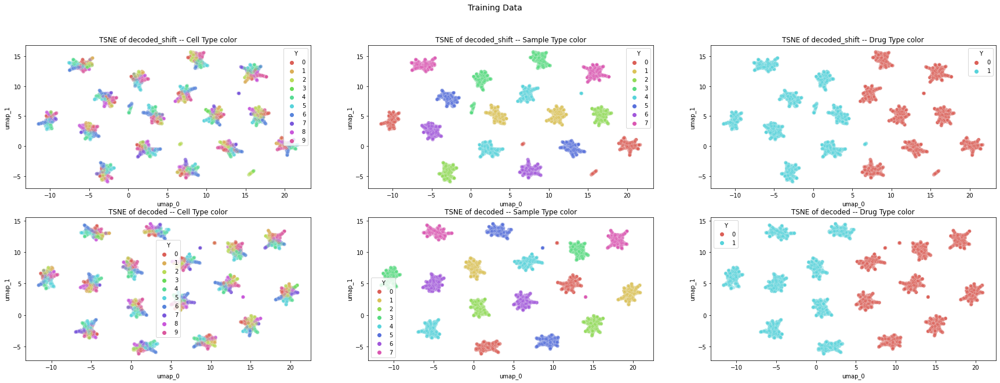

In [54]:
# Plot all Patients

label_temp = np.copy(Label_full)
perturb_temp = Drug_full
Y_temp = np.copy(prop_outputs)
Y_temp = np.argmax(Y_temp, axis=1)

fig, axs = plt.subplots(2, 3, figsize=(30,10))

plot_df = get_umap_for_plotting(np.asarray(decoded_0_1))
plot_umap(plot_df, color_vec=Y_temp, ax=axs[0,0], title="TSNE of decoded_shift -- Cell Type color")
plot_umap(plot_df, color_vec=label_temp, ax=axs[0,1], title="TSNE of decoded_shift -- Sample Type color")
plot_umap(plot_df, color_vec=perturb_temp, ax=axs[0,2], title="TSNE of decoded_shift -- Drug Type color")

plot_df = get_umap_for_plotting(np.asarray(decoded_0_0))
plot_umap(plot_df, color_vec=Y_temp, ax=axs[1,0], title="TSNE of decoded -- Cell Type color")
plot_umap(plot_df, color_vec=label_temp, ax=axs[1,1], title="TSNE of decoded -- Sample Type color")
plot_umap(plot_df, color_vec=perturb_temp, ax=axs[1,2], title="TSNE of decoded -- Drug Type color")


fig.suptitle("Training Data", fontsize=14)

fig.show()


(1000, 2)
(1000, 2)
(1000, 2)
(1000, 2)


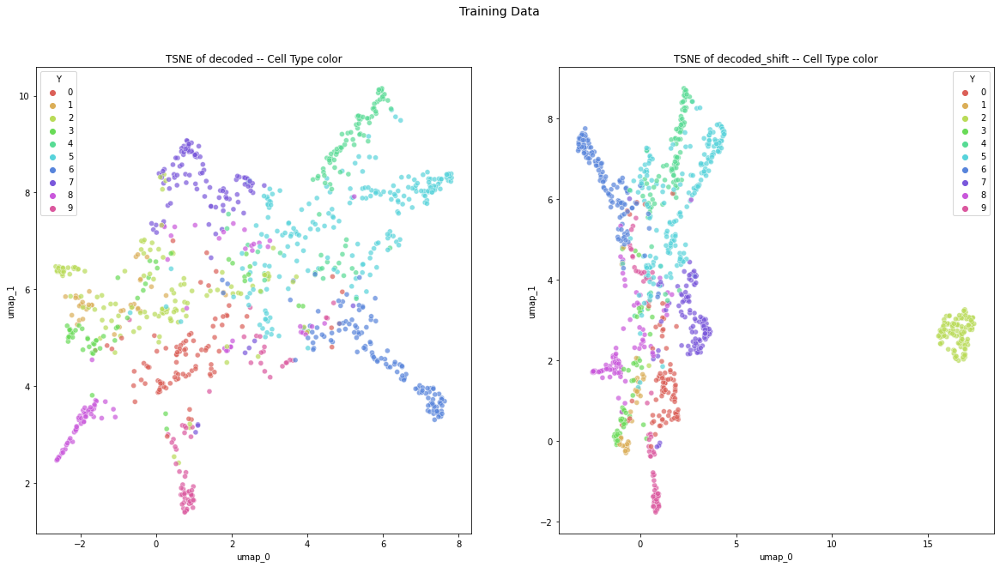

In [55]:
# Plot patient of interest

label_temp = np.copy(Label_full)
perturb_temp = Drug_full
Y_temp = np.copy(prop_outputs)
Y_temp = np.argmax(Y_temp, axis=1)

samp_0 = range(1000)

fig, axs = plt.subplots(1, 2, figsize=(20,10))


plot_df = get_umap_for_plotting(np.asarray(decoded_0_0[samp_0,]))
plot_umap(plot_df, color_vec=Y_temp[samp_0], ax=axs[0], title="TSNE of decoded -- Cell Type color", alpha=0.7)

plot_df = get_umap_for_plotting(np.asarray(decoded_0_1[samp_0,]))
plot_umap(plot_df, color_vec=Y_temp[samp_0], ax=axs[1], title="TSNE of decoded_shift -- Cell Type color", alpha=0.7)


fig.suptitle("Training Data", fontsize=14)

fig.show()




## Sample projections

In [56]:
# now we will take one cell type and project it across different sample IDs.
# this will allow us to see how well the reconstruction does

X_temp = np.copy(X_full)

# now use the encoder to get the latent spaces
z_slack, mu_slack, l_sigma_slack, z_rot, mu_rot, l_sigma_rot, z_drug, mu_drug, l_sigma_drug = encoder_unlab.predict(X_temp, batch_size=batch_size)
prop_outputs = classifier.predict(X_temp, batch_size=batch_size)

# first take all the samples from patient 0 where cell_0 is the max
label_temp = np.copy(Label_full)
Y_temp = np.copy(prop_outputs)
Y_temp = np.argmax(Y_temp, axis=1)
idx_0_patient = np.where(np.logical_and(label_temp == 0, Y_temp == 0))[0]

# and take a random set of the samples from patient 1 
# of the length of idx_0_patient
# this is because we will use this random sample as our translation
idx_1_patient = np.where(label_temp == 1,)[0]
idx_1_patient = np.random.choice(idx_1_patient, len(idx_0_patient))

# now for patient 0, cell type 0
# we are shifting it to patient 1 cell type 0
# cell type should remain the same because the latent spaces are
# disentangled and we are not changing Y
z_rot_perturb = np.copy(z_rot)
z_rot_perturb[idx_0_patient,] = z_rot_perturb[idx_1_patient,]

# now concatenate together and decode
z_concat_unlab_perturb = np.hstack([z_slack, prop_outputs, z_rot_perturb, z_drug])
decoded_0_1 = decoder.predict(z_concat_unlab_perturb, batch_size=batch_size)

# compare with original
z_concat_unlab_UNperturb = np.hstack([z_slack, prop_outputs, z_rot, z_drug])
decoded_0_0 = decoder.predict(z_concat_unlab_UNperturb, batch_size=batch_size)




(16000, 2)
(16000, 2)


/tmp/ipykernel_345899/563184163.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plot_df['Y'] = color_vec


(16000, 2)
(16000, 2)


/tmp/ipykernel_345899/563184163.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plot_df['Y'] = color_vec


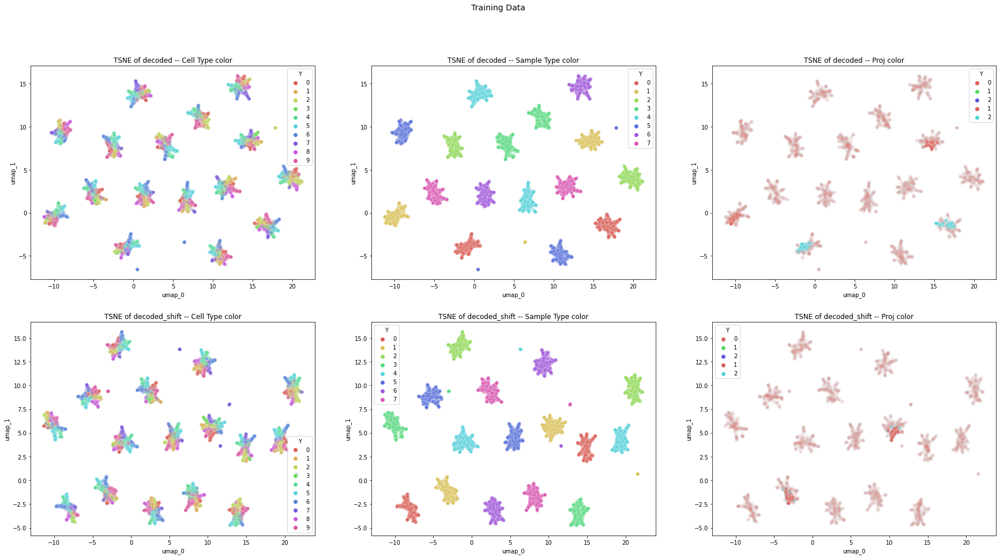

In [57]:
# Plot all patients

label_temp = np.copy(Label_full)
perturb_temp = Drug_full
Y_temp = np.copy(prop_outputs)
Y_temp = np.argmax(Y_temp, axis=1)

proj_temp = np.array([0]*len(Y_temp)) # ["other"]*len(Y_temp)

idx_proj_cell0 = np.where(np.logical_and(Y_temp == 0, label_temp == 1))[0]
idx_reg_cell0 = np.where(np.logical_and(Y_temp == 0, label_temp == 0))[0]

proj_temp[idx_proj_cell0] = 1 #"cell0 samp 0"
proj_temp[idx_reg_cell0] = 2 #"cell0 samp 1"


only_cell_0_interest = np.union1d(idx_proj_cell0, idx_reg_cell0)

fig, axs = plt.subplots(2, 3, figsize=(30,15))

plot_df = get_umap_for_plotting(np.asarray(decoded_0_0))
plot_umap(plot_df, color_vec=Y_temp, ax=axs[0,0], title="TSNE of decoded -- Cell Type color")
plot_umap(plot_df, color_vec=label_temp, ax=axs[0,1], title="TSNE of decoded -- Sample Type color")
plot_umap(plot_df, color_vec=proj_temp, ax=axs[0,2], title="TSNE of decoded -- Proj color", alpha=0.01)
plot_umap(plot_df.iloc[only_cell_0_interest], color_vec=proj_temp[only_cell_0_interest], ax=axs[0,2], title="TSNE of decoded -- Proj color")

plot_df = get_umap_for_plotting(np.asarray(decoded_0_1))
plot_umap(plot_df, color_vec=Y_temp, ax=axs[1,0], title="TSNE of decoded_shift -- Cell Type color")
plot_umap(plot_df, color_vec=label_temp, ax=axs[1,1], title="TSNE of decoded_shift -- Sample Type color")
plot_umap(plot_df, color_vec=proj_temp, ax=axs[1,2], title="TSNE of decoded_shift -- Proj color", alpha=0.01)
plot_umap(plot_df.iloc[only_cell_0_interest], color_vec=proj_temp[only_cell_0_interest], ax=axs[1,2], title="TSNE of decoded_shift -- Proj color")


fig.suptitle("Training Data", fontsize=14)

fig.show()



(4000, 2)
(4000, 2)
(4000, 2)
(4000, 2)


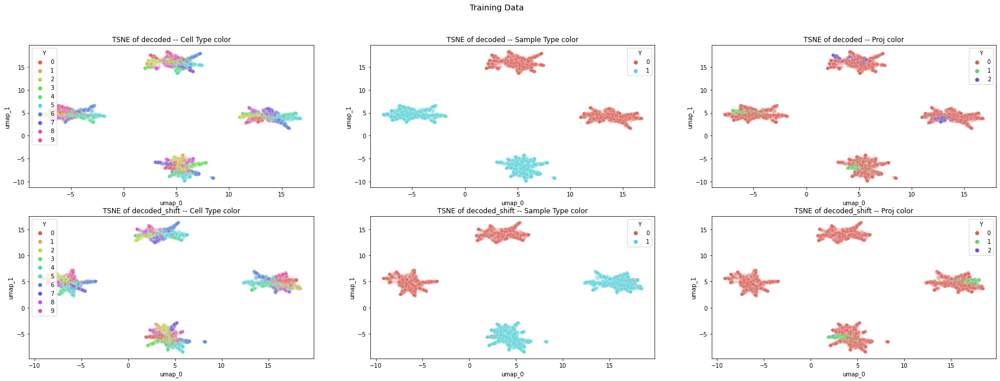

In [58]:
# Plot patient of interest

label_temp = np.copy(Label_full)
perturb_temp = Drug_full
Y_temp = np.copy(prop_outputs)
Y_temp = np.argmax(Y_temp, axis=1)

proj_temp = np.array([0]*len(Y_temp)) # ["other"]*len(Y_temp)

idx_proj_cell0 = np.where(np.logical_and(Y_temp == 0, label_temp == 1))[0]
idx_reg_cell0 = np.where(np.logical_and(Y_temp == 0, label_temp == 0))[0]

proj_temp[idx_proj_cell0] = 1 #"cell0 projected to samp 1"
proj_temp[idx_reg_cell0] = 2 #"cell0 already in samp 1"


samp_0 = range(4000)

fig, axs = plt.subplots(2, 3, figsize=(30,10))


plot_df = get_umap_for_plotting(np.asarray(decoded_0_0[samp_0,]))
plot_umap(plot_df, color_vec=Y_temp[samp_0], ax=axs[0,0], title="TSNE of decoded -- Cell Type color")
plot_umap(plot_df, color_vec=label_temp[samp_0], ax=axs[0,1], title="TSNE of decoded -- Sample Type color")
plot_umap(plot_df, color_vec=proj_temp[samp_0], ax=axs[0,2], title="TSNE of decoded -- Proj color")

plot_df = get_umap_for_plotting(np.asarray(decoded_0_1[samp_0,]))
plot_umap(plot_df, color_vec=Y_temp[samp_0], ax=axs[1,0], title="TSNE of decoded_shift -- Cell Type color")
plot_umap(plot_df, color_vec=label_temp[samp_0], ax=axs[1,1], title="TSNE of decoded_shift -- Sample Type color")
plot_umap(plot_df, color_vec=proj_temp[samp_0], ax=axs[1,2], title="TSNE of decoded_shift -- Proj color")


fig.suptitle("Training Data", fontsize=14)

fig.show()



### drug perturbation

In [59]:
Drug_full

array([1, 1, 1, ..., 0, 0, 0])

In [60]:
# now we will take one cell type and project it across different sample IDs.
# this will allow us to see how well the reconstruction does
label_temp = np.copy(Label_full)
perturb_temp = np.copy(Drug_full)

X_temp = np.copy(X_full)

prop_outputs = classifier.predict(X_temp, batch_size=batch_size)
Y_temp = np.copy(prop_outputs)
Y_temp = np.argmax(Y_temp, axis=1)


# now use the encoder to get the latent spaces
z_slack, mu_slack, l_sigma_slack, z_rot, mu_rot, l_sigma_rot, z_drug, mu_drug, l_sigma_drug = encoder_unlab.predict(X_temp, batch_size=batch_size)

# first take all the samples from patient 0 where cell_4 is the max and not perturbed
label_temp = np.copy(Label_full)
Y_temp = np.copy(prop_outputs)
Y_temp = np.argmax(Y_temp, axis=1)
idx_0_patient = np.where(np.logical_and(perturb_temp == 0, np.logical_and(label_temp == 0, Y_temp == 4)))[0]

# and take a random set of the samples from patients with a perturbation 
# of the length of idx_0_patient
# this is because we will use this random sample as our translation
idx_1_patient = np.where(np.logical_and(perturb_temp == 1, Y_temp == 4))[0]
idx_1_patient = np.random.choice(idx_1_patient, len(idx_0_patient))

# now for patient 0, cell type 0
# we are shifting it to patient 1 cell type 0
# cell type should remain the same because the latent spaces are
# disentangled and we are not changing Y
z_drug_perturb = np.copy(z_drug)
z_drug_perturb[idx_0_patient,] = z_drug_perturb[idx_1_patient,]

# now concatenate together and decode
z_concat_unlab_perturb = np.hstack([z_slack, prop_outputs, z_rot, z_drug_perturb])
decoded_0_1 = decoder.predict(z_concat_unlab_perturb, batch_size=batch_size)
decoded_0_1 = scaler.inverse_transform(decoded_0_1)


# compare with original
z_concat_unlab_UNperturb = np.hstack([z_slack, prop_outputs, z_rot, z_drug])
decoded_0_0 = decoder.predict(z_concat_unlab_UNperturb, batch_size=batch_size)
decoded_0_0 = scaler.inverse_transform(decoded_0_0)




/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/sklearn/manifold/_spectral_embedding.py:260: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


(16000, 2)
(16000, 2)


/tmp/ipykernel_345899/563184163.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plot_df['Y'] = color_vec
/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/sklearn/manifold/_spectral_embedding.py:260: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


(16000, 2)
(16000, 2)


/tmp/ipykernel_345899/563184163.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  plot_df['Y'] = color_vec


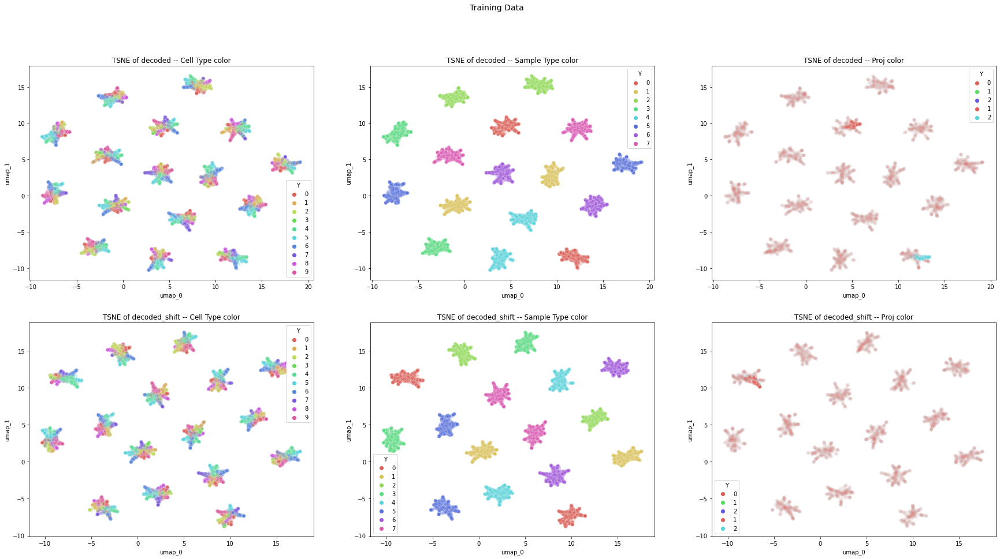

In [61]:
# Plot all patients

label_temp = np.copy(Label_full)
perturb_temp = Drug_full
Y_temp = np.copy(prop_outputs)
Y_temp = np.argmax(Y_temp, axis=1)

proj_temp = np.array([0]*len(Y_temp)) # ["other"]*len(Y_temp)

idx_proj_cell0 = np.where(np.logical_and(perturb_temp == 0, np.logical_and(Y_temp == 4, label_temp == 0)))[0]
idx_reg_cell0 = np.where(np.logical_and(perturb_temp == 1, np.logical_and(Y_temp == 4, label_temp == 0)))[0]

proj_temp[idx_proj_cell0] = 1 #"cell0 samp 0"
proj_temp[idx_reg_cell0] = 2 #"cell0 samp 1"


only_cell_0_interest = np.union1d(idx_proj_cell0, idx_reg_cell0)

fig, axs = plt.subplots(2, 3, figsize=(30,15))

plot_df = get_umap_for_plotting(np.asarray(decoded_0_0))
plot_umap(plot_df, color_vec=Y_temp, ax=axs[0,0], title="TSNE of decoded -- Cell Type color")
plot_umap(plot_df, color_vec=label_temp, ax=axs[0,1], title="TSNE of decoded -- Sample Type color")
plot_umap(plot_df, color_vec=proj_temp, ax=axs[0,2], title="TSNE of decoded -- Proj color", alpha=0.01)
plot_umap(plot_df.iloc[only_cell_0_interest], color_vec=proj_temp[only_cell_0_interest], ax=axs[0,2], title="TSNE of decoded -- Proj color")

plot_df = get_umap_for_plotting(np.asarray(decoded_0_1))
plot_umap(plot_df, color_vec=Y_temp, ax=axs[1,0], title="TSNE of decoded_shift -- Cell Type color")
plot_umap(plot_df, color_vec=label_temp, ax=axs[1,1], title="TSNE of decoded_shift -- Sample Type color")
plot_umap(plot_df, color_vec=proj_temp, ax=axs[1,2], title="TSNE of decoded_shift -- Proj color", alpha=0.01)
plot_umap(plot_df.iloc[only_cell_0_interest], color_vec=proj_temp[only_cell_0_interest], ax=axs[1,2], title="TSNE of decoded_shift -- Proj color")


fig.suptitle("Training Data", fontsize=14)

fig.show()



(2000, 2)
(2000, 2)
(2000, 2)
(2000, 2)


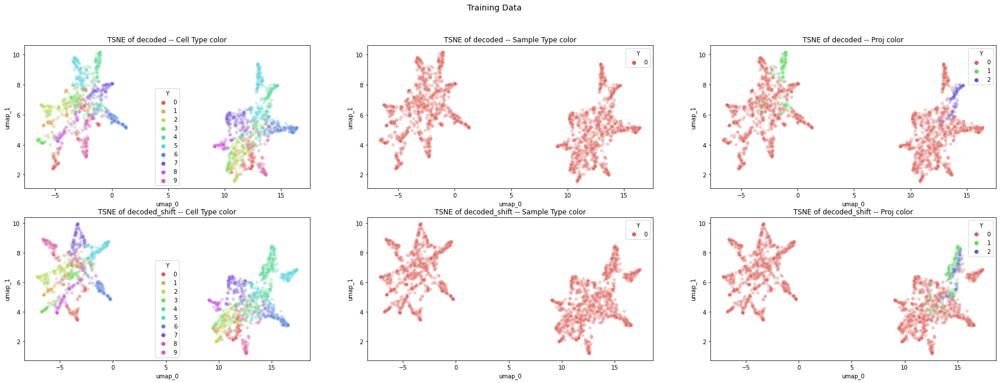

In [62]:
# Plot patient of interest

label_temp = np.copy(Label_full)
perturb_temp = Drug_full
Y_temp = np.copy(prop_outputs)
Y_temp = np.argmax(Y_temp, axis=1)

proj_temp = np.array([0]*len(Y_temp)) # ["other"]*len(Y_temp)


idx_proj_cell0 = np.where(np.logical_and(perturb_temp == 0, np.logical_and(Y_temp == 4, label_temp == 0)))[0]
idx_reg_cell0 = np.where(np.logical_and(perturb_temp == 1, np.logical_and(Y_temp == 4, label_temp == 0)))[0]

proj_temp[idx_proj_cell0] = 1 #"cell0 projected to samp 1"
proj_temp[idx_reg_cell0] = 2 #"cell0 already in samp 1"


samp_0 = range(2000)

fig, axs = plt.subplots(2, 3, figsize=(30,10))


plot_df = get_umap_for_plotting(np.asarray(decoded_0_0[samp_0,]))
plot_umap(plot_df, color_vec=Y_temp[samp_0], ax=axs[0,0], title="TSNE of decoded -- Cell Type color")
plot_umap(plot_df, color_vec=label_temp[samp_0], ax=axs[0,1], title="TSNE of decoded -- Sample Type color")
plot_umap(plot_df, color_vec=proj_temp[samp_0], ax=axs[0,2], title="TSNE of decoded -- Proj color")

plot_df = get_umap_for_plotting(np.asarray(decoded_0_1[samp_0,]))
plot_umap(plot_df, color_vec=Y_temp[samp_0], ax=axs[1,0], title="TSNE of decoded_shift -- Cell Type color")
plot_umap(plot_df, color_vec=label_temp[samp_0], ax=axs[1,1], title="TSNE of decoded_shift -- Sample Type color")
plot_umap(plot_df, color_vec=proj_temp[samp_0], ax=axs[1,2], title="TSNE of decoded_shift -- Proj color")


fig.suptitle("Training Data", fontsize=14)

fig.show()



In [63]:
def plot_expr_corr(xval, yval, ax, title, xlab, ylab, class_id, max_val=2700):

    plot_df = pd.DataFrame(list(zip(xval, yval)))
    plot_df.columns = [xlab, ylab]

    g = sns.scatterplot(
        x=xlab, y=ylab,
        data=plot_df,ax=ax,
        hue=class_id,
        alpha=0.5
    )
    g.set(ylim=(0, max_val))
    g.set(xlim=(0, max_val))
    g.plot([0, max_val], [0, max_val], transform=g.transAxes)


    ax.set_title(title)
    return g


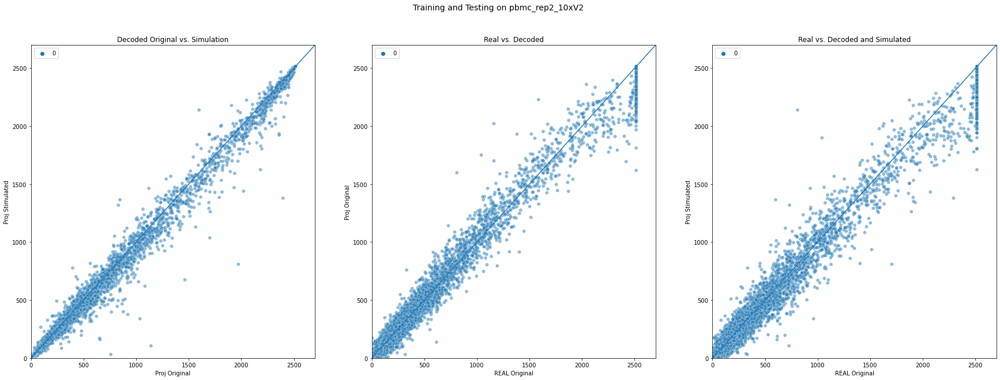

In [64]:
X_tmp = X_full
X_tmp = scaler.inverse_transform(X_tmp)


idx_proj_cell0 = np.where(np.logical_and(perturb_temp == 0, np.logical_and(Y_temp == 4, label_temp == 0)))[0]
idx_reg_cell0 = np.where(np.logical_and(perturb_temp == 1, np.logical_and(Y_temp == 4, label_temp == 0)))[0]

projected_original = decoded_0_1[idx_reg_cell0,]
real_original = X_tmp[idx_reg_cell0,]
projected_simulated = decoded_0_1[idx_proj_cell0,]

projected_original = np.median(projected_original, axis=0)
real_original = np.median(real_original, axis=0)
projected_simulated = np.median(projected_simulated, axis=0)

class_color = [0]*len(projected_original)

fig, axs = plt.subplots(1, 3, figsize=(30,10))

plot_expr_corr(projected_original, projected_simulated, axs[0], title="Decoded Original vs. Simulation", xlab="Proj Original", ylab="Proj Stimulated", class_id=class_color)
plot_expr_corr(real_original, projected_original, axs[1], title="Real vs. Decoded", xlab="REAL Original", ylab="Proj Original", class_id=class_color)
plot_expr_corr(real_original, projected_simulated, axs[2], title="Real vs. Decoded and Simulated", xlab="REAL Original", ylab="Proj Stimulated", class_id=class_color)


fig.suptitle("Training and Testing on pbmc_rep2_10xV2", fontsize=14)

fig.show()

In [65]:
from sklearn.metrics import r2_score

coefficient_of_dermination = r2_score(real_original, projected_simulated)
coefficient_of_dermination

0.9814469039994083

## Compare gene expression between sim and non

In [117]:
# this is to generate noisy vector where the second elements is the largest
def add_vec_noise_idx(idx):
    in_vec =  np.array([0,0,0,0,0,0,0, 0, 0, 0])
    in_vec[idx] = 1000
    a = np.random.lognormal(mean=0, sigma=1, size=10) + in_vec
    return a/a.sum()


In [67]:
len(idx_1_patient)

116

In [68]:
min_idx = np.min([len(idx_0_patient), len(idx_1_patient)])
min_idx

116

In [69]:
# now we will take one cell type and project it across different sample IDs.
# this will allow us to see how well the reconstruction does
label_temp = np.copy(Label_full)
perturb_temp = np.copy(Drug_full)

X_temp = np.copy(X_full)

prop_outputs = classifier.predict(X_temp, batch_size=batch_size)
Y_temp = np.copy(prop_outputs)
Y_temp = np.argmax(Y_temp, axis=1)


# now use the encoder to get the latent spaces
z_slack, mu_slack, l_sigma_slack, z_rot, mu_rot, l_sigma_rot, z_drug, mu_drug, l_sigma_drug = encoder_unlab.predict(X_temp, batch_size=batch_size)

# now we will do a full simulation

samp_idx = 0
cell_idx = 0

# first take all the samples from patient==0 
idx_0_patient = np.where(np.logical_and(label_temp == samp_idx, np.logical_and(perturb_temp == 0, Y_temp == cell_idx)))[0]
idx_1_patient = np.where(np.logical_and(label_temp == samp_idx, np.logical_and(perturb_temp == 1, Y_temp == cell_idx)))[0]

min_idx = np.min([len(idx_0_patient), len(idx_1_patient)])
idx_0_patient = np.random.choice(idx_0_patient, min_idx)
idx_1_patient = np.random.choice(idx_1_patient, min_idx)


# simulate 1 cell type
noisy_prop_vec = [add_vec_noise_idx(0) for i in range(min_idx)]
noisy_prop_vec = np.vstack(noisy_prop_vec)



# now concatenate together and decode
z_concat_unlab_unperturb = np.hstack([z_slack[idx_0_patient,], noisy_prop_vec, z_rot[idx_0_patient,], z_drug[idx_0_patient,]])
decoded_0_0 = decoder.predict(z_concat_unlab_unperturb, batch_size=batch_size)
decoded_0_0 = scaler.inverse_transform(decoded_0_0)


# compare with original
z_concat_unlab_perturb = np.hstack([z_slack[idx_0_patient,], noisy_prop_vec, z_rot[idx_0_patient,], z_drug[idx_1_patient,]])
decoded_0_1 = decoder.predict(z_concat_unlab_perturb, batch_size=batch_size)
decoded_0_1 = scaler.inverse_transform(decoded_0_1)




In [70]:
decoded_0_0.shape

(92, 7021)

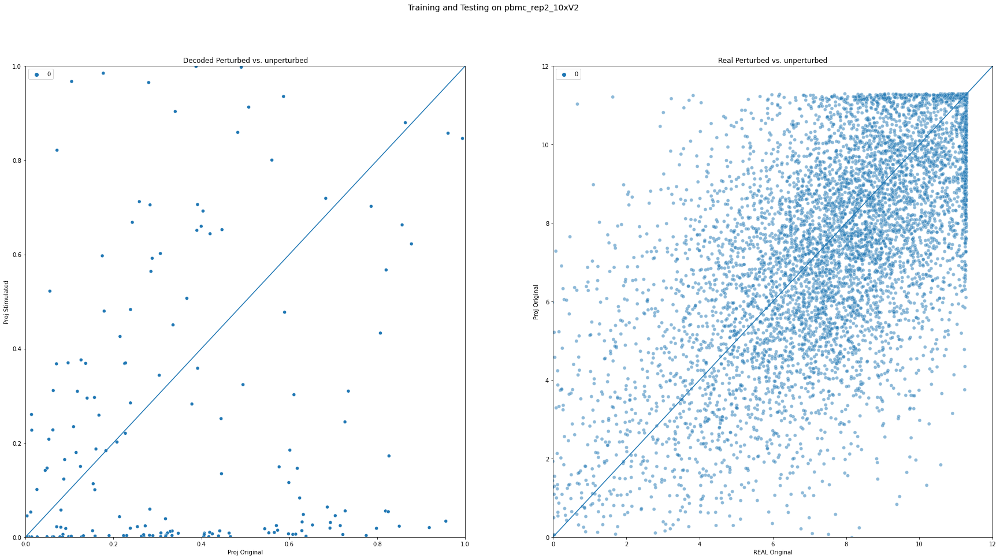

In [71]:


projected_original = np.median(decoded_0_0, axis=0)
projected_simulated = np.median(decoded_0_1, axis=0)

class_color = [0]*len(projected_original)

fig, axs = plt.subplots(1, 2, figsize=(30,15))

plot_cell_specific_corr(projected_original, projected_simulated, axs[0], title="Decoded Perturbed vs. unperturbed", xlab="Proj Original", ylab="Proj Stimulated", class_id=class_color)
plot_expr_corr(np.log2(projected_original), np.log2(projected_simulated), axs[1], title="Real Perturbed vs. unperturbed", xlab="REAL Original", ylab="Proj Original", class_id=class_color, max_val=12)


fig.suptitle("Training and Testing on pbmc_rep2_10xV2", fontsize=14)

fig.show()

In [72]:
X_temp.shape[0]

16000

In [73]:
len(projected_original)

7021

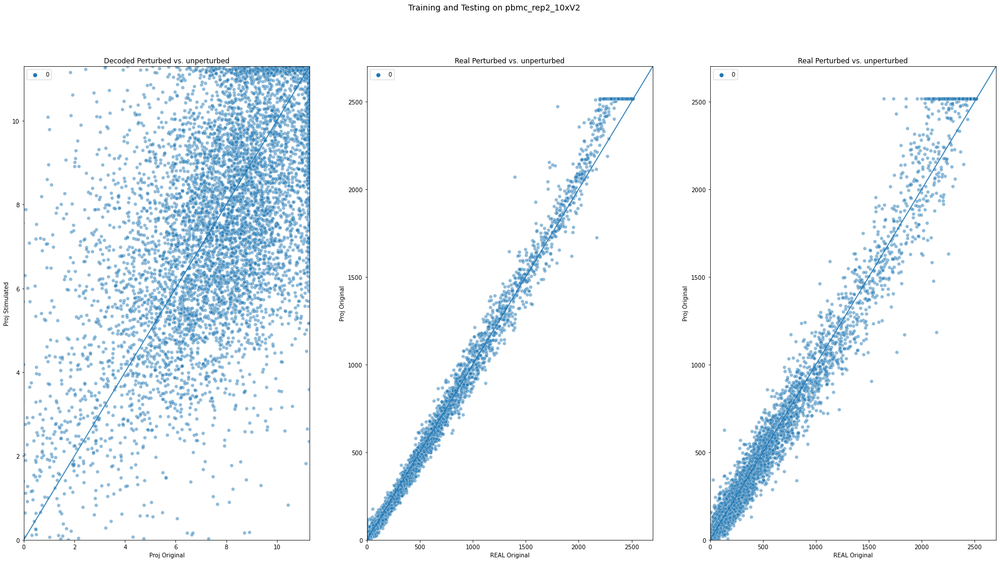

In [74]:
# now we will take one cell type and project it across different sample IDs.
# this will allow us to see how well the reconstruction does
label_temp = np.copy(Label_full)
perturb_temp = np.copy(Drug_full)

X_temp = np.copy(X_full)
X_invs = np.copy(X_full)
X_invs = scaler.inverse_transform(X_invs)

prop_outputs = classifier.predict(X_temp, batch_size=batch_size)
Y_temp = np.copy(prop_outputs)
Y_temp = np.argmax(Y_temp, axis=1)

# simulate 1 cell type
noisy_prop_vec = [add_vec_noise_idx(4) for i in range(X_temp.shape[0])]
noisy_prop_vec = np.vstack(noisy_prop_vec)


# now use the encoder to get the latent spaces
z_slack, mu_slack, l_sigma_slack, z_rot, mu_rot, l_sigma_rot, z_drug, mu_drug, l_sigma_drug = encoder_unlab.predict(X_temp, batch_size=batch_size)

# first take all the samples from patient 0 where cell_4 is the max and not perturbed
label_temp = np.copy(Label_full)
Y_temp = np.copy(prop_outputs)
Y_temp = np.argmax(Y_temp, axis=1)
idx_0_patient = np.where(np.logical_and(perturb_temp == 0, np.logical_and(label_temp == 0, Y_temp == 4)))[0]
idx_00_patient = np.where(np.logical_and(perturb_temp == 1, np.logical_and(label_temp == 0, Y_temp == 4)))[0]
idx_00_patient = np.sort(np.random.choice(idx_00_patient, len(idx_0_patient)))



# compare with original
z_concat_unlab_UNperturb = np.hstack([z_slack, prop_outputs, z_rot, z_drug])
decoded_0_0 = decoder.predict(z_concat_unlab_UNperturb, batch_size=batch_size)
decoded_0_0 = scaler.inverse_transform(decoded_0_0)
decoded_0_1 = decoded_0_0[idx_00_patient,]
decoded_0_0 = decoded_0_0[idx_0_patient,]

orig_01 = X_invs[idx_00_patient,]
orig_00 = X_invs[idx_0_patient,]

projected_original = np.median(decoded_0_0, axis=0)
projected_simulated = np.median(decoded_0_1, axis=0)

orig_01 = np.median(orig_01, axis=0)
orig_00 = np.median(orig_00, axis=0)

class_color = [0]*len(projected_original)

fig, axs = plt.subplots(1, 3, figsize=(30,15))

max_val = np.max([np.log2(projected_original), np.log2(projected_simulated)])
plot_expr_corr(np.log2(projected_original), np.log2(projected_simulated), axs[0], title="Decoded Perturbed vs. unperturbed", xlab="Proj Original", ylab="Proj Stimulated", class_id=class_color, max_val = max_val)
plot_expr_corr(projected_original, orig_00, axs[1], title="Real Perturbed vs. unperturbed", xlab="REAL Original", ylab="Proj Original", class_id=class_color)
plot_expr_corr(projected_simulated, orig_01, axs[2], title="Real Perturbed vs. unperturbed", xlab="REAL Original", ylab="Proj Original", class_id=class_color)


fig.suptitle("Training and Testing on pbmc_rep2_10xV2", fontsize=14)

fig.show()


In [77]:
# simulate 1 cell type
noisy_prop_vec = [add_vec_noise_idx(4) for i in range(X_temp.shape[0])]
noisy_prop_vec = np.vstack(noisy_prop_vec)
noisy_prop_vec

array([[0.00853498, 0.01186376, 0.0113983 , ..., 0.00352476, 0.00889707,
        0.0110584 ],
       [0.06018615, 0.0192543 , 0.00776621, ..., 0.00227316, 0.00540226,
        0.00264043],
       [0.01066699, 0.02323659, 0.01039883, ..., 0.00749266, 0.02815981,
        0.00913053],
       ...,
       [0.0222795 , 0.02522013, 0.01670814, ..., 0.00552847, 0.00471504,
        0.00230025],
       [0.02207312, 0.01748086, 0.01673761, ..., 0.00201566, 0.01367208,
        0.01385721],
       [0.02184282, 0.00536324, 0.02494709, ..., 0.08426815, 0.00375989,
        0.01352795]])

In [79]:
z_rot.shape

(16000, 64)

In [84]:
np.where(perturb_temp == 0)[0]

array([ 1000,  1001,  1002, ..., 15997, 15998, 15999])

In [172]:
Y_train.shape[1]

10

In [119]:
noisy_prop_vec[0,]

array([0.00852421, 0.03655155, 0.0048216 , 0.01399515, 0.89762813,
       0.00135854, 0.00176103, 0.00472289, 0.00160674, 0.02903015])

In [173]:

label_temp = np.copy(Label_full)
perturb_temp = np.copy(Drug_full)

X_temp = np.copy(X_full)
X_invs = np.copy(X_full)
X_invs = scaler.inverse_transform(X_invs)

# make XX samples 
num_samp_gen = 5000

all_res = [0]*Y_train.shape[1]

for cell_idx in range(Y_train.shape[1]):


    # now use the encoder to get the latent spaces
    z_slack, mu_slack, l_sigma_slack, z_rot, mu_rot, l_sigma_rot, z_drug, mu_drug, l_sigma_drug = encoder_unlab.predict(X_temp, batch_size=batch_size)

    # simulate 1 cell type
    noisy_prop_vec = [add_vec_noise_idx(cell_idx) for i in range(num_samp_gen)]
    noisy_prop_vec = np.vstack(noisy_prop_vec)

    # randomly sample the sample_ids (integrating over all latent codes)
    z_rot_samp_idx = np.sort(np.random.choice(range(z_rot.shape[0]), num_samp_gen))
    z_rot_samp = z_rot[z_rot_samp_idx,]

    # randomly sample the slack (integrating over all latent codes)
    z_slack_samp_idx = np.sort(np.random.choice(range(z_slack.shape[0]), num_samp_gen))
    z_slack_samp = z_slack[z_slack_samp_idx,]

    # sample the the perturbed latent space
    z_drug_0_idx = np.random.choice(np.where(perturb_temp == 0)[0], num_samp_gen)
    z_drug_0_idx = np.sort(z_drug_0_idx)
    z_drug_0 = z_drug[z_drug_0_idx,]

    z_drug_1_idx = np.random.choice(np.where(perturb_temp == 1)[0], num_samp_gen)
    z_drug_1_idx = np.sort(z_drug_1_idx)
    z_drug_1 = z_drug[z_drug_1_idx,]


    # put it all together

    # generate unperturbed data -- integrated over all other latent spaces
    z_concat_UNperturb = np.hstack([z_slack_samp, noisy_prop_vec, z_rot_samp, z_drug_0])
    decoded_0 = decoder.predict(z_concat_UNperturb, batch_size=batch_size)
    decoded_0 = scaler.inverse_transform(decoded_0)

    # generate unperturbed data -- integrated over all other latent spaces
    z_concat_perturb = np.hstack([z_slack_samp, noisy_prop_vec, z_rot_samp, z_drug_1])
    decoded_1 = decoder.predict(z_concat_perturb, batch_size=batch_size)
    decoded_1 = scaler.inverse_transform(decoded_1)


    decoded_0_med = np.median(decoded_0, axis=0)
    decoded_1_med = np.median(decoded_1, axis=0)

    res_df = pd.DataFrame(list(zip(decoded_0_med, decoded_1_med)), columns=["unpert", "pert"])
    res_df["FC"] = res_df.pert / res_df.unpert
    res_df["log2FC"] = np.log2(res_df.FC)
    res_df["gene_ids"] = union_genes
    res_df.set_index("gene_ids", inplace = True)

    all_res[cell_idx] = res_df
        


In [174]:
all_res[0]

,unpert,pert,FC,log2FC
gene_ids,,,,
A1BG,200.223663,60.896034,0.304140,-1.717192
A2M,5.069623,6.432453,1.268823,0.343491
A2M-AS1,1.387174,0.048317,0.034832,-4.843463
A4GALT,53.760750,3.186920,0.059280,-4.076319
AAED1,397.663208,316.112244,0.794925,-0.331110
...,...,...,...,...
ZWILCH,8.353045,40.345314,4.830013,2.272027
ZYX,247.632797,82.336594,0.332495,-1.588597
ZZEF1,20.315479,3.042711,0.149773,-2.739150


In [ ]:

class_color = [0]*len(decoded_0_med)

fig, axs = plt.subplots(10, 3, figsize=(30,15))
row_idx = 0
for cell_idx in range(Y_train.shape[1]):

    curr_cell_type = Y_train.columns[cell_idx]
    curr_res = all_res[cell_idx]

    unpert_val = curr_res["unpert"]
    pert_val = curr_res["pert"]

    max_val_log2 = np.max([np.log2(unpert_val), np.log2(unpert_val)])
    max_val = np.max([unpert_val, pert_val])
    plot_expr_corr(np.log2(unpert_val), np.log2(pert_val), axs[,0], title="log2 Perturbed vs. unperturbed", xlab="non-perturbed", ylab="perturbed", class_id=class_color, max_val = max_val_log2)
    plot_expr_corr(unpert_val, pert_val, axs[,1], title="Perturbed vs. unperturbed", xlab="non-perturbed", ylab="perturbed", class_id=class_color, max_val = max_val)

    row_idx = row_idx+1

fig.suptitle("Integrated over Perturb vs nonPerturb", fontsize=14)

fig.show()


/beevol/home/davidson/miniconda3/envs/sc_bulk_ood/lib/python3.9/site-packages/sklearn/manifold/_spectral_embedding.py:260: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


(10000, 2)
(10000, 2)
(10000, 2)
(10000, 2)


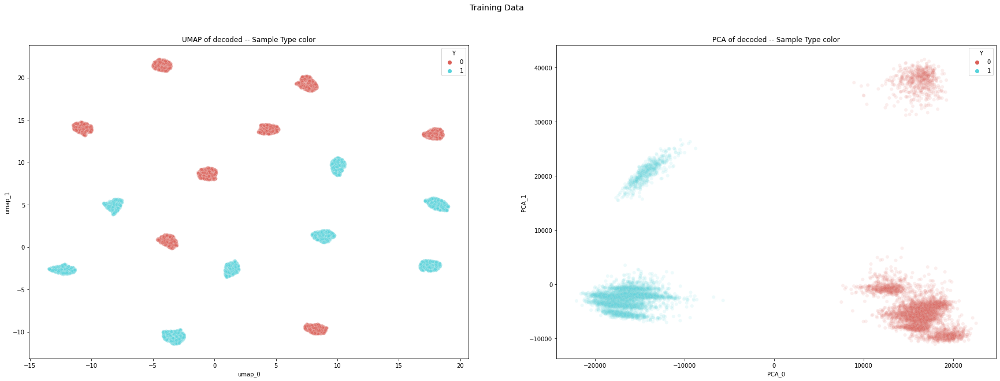

In [162]:
class_color = [0]*num_samp_gen+[1]*num_samp_gen
full_matr_sim = np.vstack((decoded_0, decoded_1))

fig, axs = plt.subplots(1, 2, figsize=(30,10))


plot_df_umap = get_umap_for_plotting(np.asarray(full_matr_sim))
plot_umap(plot_df_umap, color_vec=class_color, ax=axs[0], title="UMAP of decoded -- Sample Type color")


plot_df_pca = get_pca_for_plotting(np.asarray(full_matr_sim))
plot_pca(plot_df_pca, color_vec=class_color, ax=axs[1], title="PCA of decoded -- Sample Type color")


fig.suptitle("Training Data", fontsize=14)

fig.show()


In [163]:
plot_df = pd.DataFrame(list(zip(decoded_0_med, decoded_1_med)), columns=["unpert", "pert"])
plot_df["FC"] = plot_df.pert / plot_df.unpert
plot_df["log2FC"] = np.log2(plot_df.FC)
plot_df["gene_ids"] = union_genes
plot_df.set_index("gene_ids", inplace = True)
plot_df

,unpert,pert,FC,log2FC
gene_ids,,,,
A1BG,266.176025,42.363792,0.159157,-2.651477
A2M,8.776115,8.188185,0.933008,-0.100039
A2M-AS1,1.337718,0.049891,0.037296,-4.744851
A4GALT,33.913986,2.914766,0.085946,-3.540428
AAED1,663.327332,1613.751709,2.432814,1.282626
...,...,...,...,...
ZWILCH,1.499282,15.503583,10.340674,3.370258
ZYX,1432.393311,623.056152,0.434976,-1.200994
ZZEF1,72.219986,19.444902,0.269245,-1.893006


In [169]:
a = plot_df.iloc[np.where(plot_df.log2FC > 2)]

In [171]:
a.index.to_list()

['ABL2',
 'AC004988.1',
 'AC009133.12',
 'AC084018.1',
 'ACTA2',
 'ADAM19',
 'ADAMDEC1',
 'ADTRP',
 'AFF1',
 'AIFM2',
 'AIM2',
 'AK4',
 'ALG8',
 'ALKBH4',
 'ANKFY1',
 'ANKRD22',
 'ANXA3',
 'ANXA4',
 'AP000640.2',
 'AP000783.1',
 'APOBEC3B',
 'APOBEC3F',
 'APOBEC3G',
 'APOL1',
 'APOL6',
 'ARAP2',
 'ARHGAP10',
 'ARHGAP11B',
 'ARHGAP25',
 'ARL5B',
 'ARMC2',
 'ARMCX1',
 'ARNTL2',
 'ASCL2',
 'ASUN',
 'ATL1',
 'ATL3',
 'AXL',
 'BAALC',
 'BATF2',
 'BATF3',
 'BAZ1B',
 'BAZ2A',
 'BCL2L14',
 'BLNK',
 'BLZF1',
 'BRCA2',
 'BRIP1',
 'C10orf2',
 'C11orf68',
 'C12orf66',
 'C15orf57',
 'C16orf54',
 'C16orf70',
 'C17orf49',
 'C17orf67',
 'C19orf66',
 'C1GALT1C1',
 'C3orf58',
 'C5orf56',
 'CALD1',
 'CASP5',
 'CASP7',
 'CASP8',
 'CBR1',
 'CBWD2',
 'CBWD5',
 'CCDC146',
 'CCDC50',
 'CCDC71L',
 'CCL3L1',
 'CCL8',
 'CCNA1',
 'CCZ1',
 'CD19',
 'CD274',
 'CD38',
 'CD40',
 'CD46',
 'CD69',
 'CD70',
 'CD72',
 'CD80',
 'CDKL1',
 'CDR2',
 'CDS2',
 'CEBPD',
 'CFLAR',
 'CH25H',
 'CHST12',
 'CKAP4',
 'CKB',
 'CLEC4C'

In [165]:
index_interest = ["ISG15", "LY6E", "IFI6", "ISG20", "MX1", "IFIT2", "IFIT1", "CXCL10", "CCL8"]

plot_df.loc[index_interest]

,unpert,pert,FC,log2FC
gene_ids,,,,
ISG15,2204.939941,2514.231445,1.140272,0.189378
LY6E,1185.615479,2514.263184,2.120640,1.084499
IFI6,2032.310791,2514.934082,1.237475,0.307400
ISG20,939.494385,2503.380371,2.664604,1.413921
MX1,259.818054,2507.840332,9.652294,3.270872
IFIT2,281.888794,2506.161621,8.890604,3.152282
IFIT1,79.554008,2511.991699,31.575930,4.980753
CXCL10,269.394012,2512.356934,9.325957,3.221252
CCL8,295.476379,2514.776855,8.510923,3.089316
